In [1]:
from __future__ import print_function
import numpy as np
import pandas as pd
import gensim
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import json
import time
import sys


In [2]:
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="9e0a3104cce94486a13b66a91d7d5abf",
                                                           client_secret="b752eead0cc04e61b960e7560fd5509f"))

In [3]:
songdf = pd.read_csv('data/db.csv')
songdf

,Artist,Song,Lyrics,ID,Audio_Features,Introspective,Club(Pleasures),Love/Sex_x,Mumble/New Age_x,Street/Gangsta Rap,...,old school lyrical,love,old school west coast,new school street,Introspective/Emo,Club,Love/Sex_y,Mumble/New Age_y,Old School/Gangsta,New School/Gangsta
0,Kanye West,Mercy,"Well, it is a weepin' and a moanin' and a gna...",4qikXelSRKvoCqFcHLB2H2,"{'danceability': 0.563, 'energy': 0.496, 'key'...",0.000756,0.018351,0.022510,0.000000,0.010649,...,0.012705,0.002121,0.000000,0.000000,0.000595,0.019416,0.021256,0.000000,0.010281,0.000000
1,Kanye West,"Father Stretch My Hands, Pt. 1",You're the only power You're the only power ...,4KW1lqgSr8TKrvBII0Brf8,"{'danceability': 0.724, 'energy': 0.573, 'key'...",0.023646,0.004200,0.019006,0.000000,0.000000,...,0.000000,0.007953,0.000648,0.000000,0.023128,0.006056,0.017761,0.000000,0.000000,0.000000
2,Kanye West,Monster,I shoot the lights out Hide 'til it's bright ...,1ZHYJ2Wwgxes4m8Ba88PeK,"{'danceability': 0.628, 'energy': 0.692, 'key'...",0.024095,0.019531,0.009372,0.005490,0.035623,...,0.014102,0.007684,0.058980,0.000000,0.023656,0.021675,0.008184,0.005397,0.034185,0.000000
3,Kanye West,Ultralight Beam,"We don't want no devils in the house, God W...",1eQBEelI2NCy7AUTerX0KS,"{'danceability': 0.592, 'energy': 0.403, 'key'...",0.081702,0.000000,0.000000,0.003375,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.081223,0.000000,0.000000,0.003530,0.000000,0.000000
4,Kanye West,Bound 2,B-B-B-B-Bound to fall in love Bound to fall i...,3sNVsP50132BTNlImLx70i,"{'danceability': 0.367, 'energy': 0.665, 'key'...",0.012735,0.004414,0.068182,0.003425,0.004778,...,0.002429,0.065069,0.003204,0.000000,0.012390,0.006533,0.066558,0.003467,0.004477,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5357,Polo G,Through da Storm,"Hey big brother, it's me, Leia Remember at th...",3NqCEpT8xsHdzpiRlM1kpS,"{'danceability': 0.71, 'energy': 0.49, 'key': ...",0.044536,0.033469,0.000061,0.007006,0.000000,...,0.000000,0.000000,0.000000,0.019581,0.044230,0.028835,0.000136,0.006833,0.000000,0.023785
5358,Polo G,Heartless,"My youngins heartless, so they ain't playi...",2iP3unJbxZvRuqyrS0ocZy,"{'danceability': 0.776, 'energy': 0.64, 'key':...",0.032030,0.036410,0.008285,0.014614,0.006375,...,0.002713,0.006679,0.009667,0.006429,0.031605,0.034493,0.007721,0.015023,0.006668,0.008237
5359,Polo G,Battle Cry,JTK I know these niggas never been a hundre...,7caP3UAf8ZtIMVpWfEIA4H,"{'danceability': 0.754, 'energy': 0.597, 'key'...",0.037670,0.041758,0.000000,0.004303,0.007571,...,0.005411,0.001630,0.007365,0.057606,0.038773,0.027627,0.000000,0.003601,0.008048,0.067756
5360,Polo G,I Know,"Bondin' over drugs and pain, dirty Sprit...",40j4RoqmLiivqzRObbQ4BF,"{'danceability': 0.807, 'energy': 0.665, 'key'...",0.058163,0.015345,0.011520,0.000881,0.000039,...,0.000000,0.019102,0.003360,0.000603,0.057459,0.014941,0.011498,0.001071,0.000363,0.001878


In [3]:
artist = list(songdf.Artist)
song = list(songdf.Song)

In [116]:
features = []

for i in range(len(artist)):
    results = sp.search(q=f'{artist[i]} {song[i]}', limit = 1)
    if len(results['tracks']['items']) == 0:
        features.append(None)
    else:
        for track in results['tracks']['items']:
            features.append((track['id'], track['name'], track['artists'][0]['name'], sp.audio_features(track['id'])))

In [127]:
songdf['features'] = features

In [146]:
songdf.to_csv('data/db.csv', index=False) 

In [110]:
results = sp.search(q=f'{artist[5]} {song[5]}', limit = 1)
for track in results['tracks']['items']:
    print())

Kanye West


In [158]:
df.isnull().values.any()

True

In [161]:
# Rows with No Audio Features
is_NaN = songdf.isnull()
row_has_NaN = is_NaN. any(axis=1)
rows_with_NaN = songdf[row_has_NaN]
rows_with_NaN

,Artist,Song,Lyrics,ID,Audio_Features
66,Lil Wayne,Lollipop (Remix),"[Intro: Lil Wayne]\nNo homo\nI say, he's so sw...",None,None
78,Lil Wayne,I’m Good (Dedication 5),"[Intro: The Weeknd]\nEverything I said I'd do,...",None,None
81,Lil Wayne,Family Feud,"[Intro: Drake]\nYeah, Dedication 6, of course\...",None,None
82,Lil Wayne,Wowzers,[Intro: Lil Wayne]\nSoulja Boy on the beat\nAy...,None,None
89,Lil Wayne,I Feel Like Dying,[Hook: Karma & Lil Wayne]\nOnly once the drugs...,None,None
...,...,...,...,...,...
5253,PnB Rock,Unforgettable (Freestyle),"[Intro]\nOh yeah\nYeah, yeah, yeah, uh\n\n[Cho...",None,None
5279,Ski Mask the Slump God,Wheres the Blow!,"[Intro: Ski Mask The Slump God]\nOkay, Hector,...",None,None
5309,Cordae,My Name Is,"[Intro]\nWooh!\nAlright, alright\nNow listen, ...",None,None
5338,Roddy Ricch,Ricch Forever,[Intro]\nDJ Bugsy\nSwish\nHehehe\n\n[Chorus]\n...,None,None


## Lyrics cleaning

In [4]:
songdf = pd.read_pickle('data/finaldb.pkl')
songdf

,Artist,Song,Lyrics,ID,Audio_Features,Introspective,Club(Pleasures),Love/Sex,Mumble/New Age,Street/Gangsta Rap,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,Kanye West,Mercy,"Well, it is a weepin' and a moanin' and a gna...",4qikXelSRKvoCqFcHLB2H2,"{'danceability': 0.563, 'energy': 0.496, 'key'...",0.000756,0.018351,0.022510,0.000000,0.010649,...,0.1730,-9.381,0.0,0.4060,139.993,4.0,https://api.spotify.com/v1/tracks/4qikXelSRKvo...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.4260
1,Kanye West,"Father Stretch My Hands, Pt. 1",You're the only power You're the only power ...,4KW1lqgSr8TKrvBII0Brf8,"{'danceability': 0.724, 'energy': 0.573, 'key'...",0.023646,0.004200,0.019006,0.000000,0.000000,...,0.5380,-4.113,1.0,0.0549,113.088,4.0,https://api.spotify.com/v1/tracks/4KW1lqgSr8TK...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.4380
2,Kanye West,Monster,I shoot the lights out Hide 'til it's bright ...,1ZHYJ2Wwgxes4m8Ba88PeK,"{'danceability': 0.628, 'energy': 0.692, 'key'...",0.024095,0.019531,0.009372,0.005490,0.035623,...,0.6680,-5.640,1.0,0.2020,124.887,5.0,https://api.spotify.com/v1/tracks/1ZHYJ2Wwgxes...,audio_features,spotify:track:1ZHYJ2Wwgxes4m8Ba88PeK,0.0963
3,Kanye West,Ultralight Beam,"We don't want no devils in the house, God W...",1eQBEelI2NCy7AUTerX0KS,"{'danceability': 0.592, 'energy': 0.403, 'key'...",0.081702,0.000000,0.000000,0.003375,0.000000,...,0.5400,-8.768,0.0,0.4140,105.169,4.0,https://api.spotify.com/v1/tracks/1eQBEelI2NCy...,audio_features,spotify:track:1eQBEelI2NCy7AUTerX0KS,0.3910
4,Kanye West,Bound 2,B-B-B-B-Bound to fall in love Bound to fall i...,3sNVsP50132BTNlImLx70i,"{'danceability': 0.367, 'energy': 0.665, 'key'...",0.012735,0.004414,0.068182,0.003425,0.004778,...,0.1130,-2.821,1.0,0.0465,148.913,4.0,https://api.spotify.com/v1/tracks/3sNVsP50132B...,audio_features,spotify:track:3sNVsP50132BTNlImLx70i,0.3100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5357,Polo G,Through da Storm,"Hey big brother, it's me, Leia Remember at th...",3NqCEpT8xsHdzpiRlM1kpS,"{'danceability': 0.71, 'energy': 0.49, 'key': ...",0.044536,0.033469,0.000061,0.007006,0.000000,...,0.0942,-9.832,1.0,0.2460,74.351,4.0,https://api.spotify.com/v1/tracks/3NqCEpT8xsHd...,audio_features,spotify:track:3NqCEpT8xsHdzpiRlM1kpS,0.6210
5358,Polo G,Heartless,"My youngins heartless, so they ain't playi...",2iP3unJbxZvRuqyrS0ocZy,"{'danceability': 0.776, 'energy': 0.64, 'key':...",0.032030,0.036410,0.008285,0.014614,0.006375,...,0.1010,-8.058,1.0,0.1840,160.038,4.0,https://api.spotify.com/v1/tracks/2iP3unJbxZvR...,audio_features,spotify:track:2iP3unJbxZvRuqyrS0ocZy,0.3260
5359,Polo G,Battle Cry,JTK I know these niggas never been a hundre...,7caP3UAf8ZtIMVpWfEIA4H,"{'danceability': 0.754, 'energy': 0.597, 'key'...",0.037670,0.041758,0.000000,0.004303,0.007571,...,0.0866,-7.809,1.0,0.3800,150.089,4.0,https://api.spotify.com/v1/tracks/7caP3UAf8ZtI...,audio_features,spotify:track:7caP3UAf8ZtIMVpWfEIA4H,0.3470
5360,Polo G,I Know,"Bondin' over drugs and pain, dirty Sprit...",40j4RoqmLiivqzRObbQ4BF,"{'danceability': 0.807, 'energy': 0.665, 'key'...",0.058163,0.015345,0.011520,0.000881,0.000039,...,0.0788,-5.249,0.0,0.2760,164.964,4.0,https://api.spotify.com/v1/tracks/40j4RoqmLiiv...,audio_features,spotify:track:40j4RoqmLiivqzRObbQ4BF,0.5570


In [5]:
songdf[songdf['Artist']=='Lil Pump']

,Artist,Song,Lyrics,ID,Audio_Features,Introspective,Club(Pleasures),Love/Sex,Mumble/New Age,Street/Gangsta Rap,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
4672,Lil Pump,Gucci Gang,"Yuh, ooh, brr, brr Gucci gang, ooh Yuh, Lil ...",43ZyHQITOjhciSUUNPVRHc,"{'danceability': 0.936, 'energy': 0.523, 'key'...",0.000000,0.068308,0.000000,0.020341,0.000000,...,0.1170,-6.710,1.0,0.0597,119.889,4.0,https://api.spotify.com/v1/tracks/43ZyHQITOjhc...,audio_features,spotify:track:43ZyHQITOjhciSUUNPVRHc,0.6990
4673,Lil Pump,D Rose,"Lil Pump, D. Rose, ooh Hundred on my wrist E...",1fEl5TPKRJAsuP6TqZ23hB,"{'danceability': 0.781, 'energy': 0.553, 'key'...",0.000000,0.017699,0.000000,0.017129,0.000000,...,0.3830,-4.277,1.0,0.0735,121.968,4.0,https://api.spotify.com/v1/tracks/1fEl5TPKRJAs...,audio_features,spotify:track:1fEl5TPKRJAsuP6TqZ23hB,0.3080
4674,Lil Pump,ESSKEETIT,"CB on the beat Only wear designer, esskeetit ...",44KKhCyI0BGS6LvVyDqJtH,"{'danceability': 0.934, 'energy': 0.505, 'key'...",0.000000,0.031471,0.000000,0.002184,0.003744,...,0.0867,-7.648,1.0,0.1680,139.930,4.0,https://api.spotify.com/v1/tracks/44KKhCyI0BGS...,audio_features,spotify:track:44KKhCyI0BGS6LvVyDqJtH,0.6910
4675,Lil Pump,Boss,"Diablo murder Ooh, yeah Lil Pump! Yeah Yeah...",1rsAFUCa6BVMgRQ3FCQQsi,"{'danceability': 0.803, 'energy': 0.789, 'key'...",0.000000,0.038953,0.000000,0.016752,0.000000,...,0.3780,-3.434,0.0,0.0383,119.999,4.0,https://api.spotify.com/v1/tracks/1rsAFUCa6BVM...,audio_features,spotify:track:1rsAFUCa6BVMgRQ3FCQQsi,0.6470
4676,Lil Pump,Flex Like Ouu,"Ooh, ooh Lil Pump Ayy, ayy, ayy Oh my God, Ro...",2hJWZvTw4QVBwC14ZNs1Ib,"{'danceability': 0.858, 'energy': 0.435, 'key'...",0.000000,0.041879,0.000000,0.040342,0.000000,...,0.0925,-11.286,1.0,0.0661,141.993,4.0,https://api.spotify.com/v1/tracks/2hJWZvTw4QVB...,audio_features,spotify:track:2hJWZvTw4QVBwC14ZNs1Ib,0.7040
4677,Lil Pump,Molly,"Huh Ooh, Bi-Big Head on the beat Ayy, Lil Pum...",3uFmweGlFudKNiX13XFwFm,"{'danceability': 0.917, 'energy': 0.624, 'key'...",0.000000,0.033245,0.000000,0.027596,0.000000,...,0.0714,-6.728,1.0,0.1470,124.984,4.0,https://api.spotify.com/v1/tracks/3uFmweGlFudK...,audio_features,spotify:track:3uFmweGlFudKNiX13XFwFm,0.3430
4678,Lil Pump,Lil Pump,Mama told me Lil Pump won't be shit I told l...,5390Dk3Wx3GZckgdEKSWyR,"{'danceability': 0.765, 'energy': 0.445, 'key'...",0.000000,0.036804,0.000000,0.054177,0.000000,...,0.3640,-11.257,1.0,0.2580,121.380,4.0,https://api.spotify.com/v1/tracks/5390Dk3Wx3GZ...,audio_features,spotify:track:5390Dk3Wx3GZckgdEKSWyR,0.3920
4679,Lil Pump,Drug Addicts,"Mmm, ayy, what's up? Everybody in my gang is...",6tpHfEM8eaETzlPOARYWfZ,"{'danceability': 0.933, 'energy': 0.488, 'key'...",0.008429,0.040815,0.000000,0.010253,0.000000,...,0.0958,-9.327,0.0,0.1490,142.064,4.0,https://api.spotify.com/v1/tracks/6tpHfEM8eaET...,audio_features,spotify:track:6tpHfEM8eaETzlPOARYWfZ,0.2100
4680,Lil Pump,Designer,You can see Lil Pump wandering the halls of a...,1LXbv9jiTtdBdHadZ317Gt,"{'danceability': 0.864, 'energy': 0.484, 'key'...",0.000000,0.082680,0.000000,0.054432,0.000000,...,0.2480,-9.159,0.0,0.3440,160.052,4.0,https://api.spotify.com/v1/tracks/1LXbv9jiTtdB...,audio_features,spotify:track:1LXbv9jiTtdBdHadZ317Gt,0.5340
4681,Lil Pump,Butterfly Doors,"CB on the beat, ho Butterfly doors Jetski, J...",4NdXQlDTzxbOMkzJGWFtz3,"{'danceability': 0.925, 'energy': 0.397, 'key'...",0.002661,0.045807,0.007594,0.000000,0.000000,...,0.1440,-11.265,1.0,0.1690,130.008,4.0,https://api.spotify.com/v1/tracks/4NdXQlDTzxbO...,audio_features,spotify:track:4NdXQlDTzxbOMkzJGWFtz3,0.4290


In [621]:
df = pd.read_csv('data/rap2020.csv')
df.rename({'0':'Song','1':'Artist','2':'Lyrics'},axis=1,inplace=True)
df

,Unnamed: 0,Song,Artist,Lyrics,3
0,0,The Box,Roddy Ricch,[Chorus]\nPullin' out the coupe at the lot\nTo...,2020
1,1,Rockstar,DaBaby Featuring Roddy Ricch,[Встпуление]\nА-а-а\nАй-я-я\nВ-а-а-у\n\n[Предп...,2020
2,2,Life Is Good,Future Featuring Drake,[Part I]\n\n[Chorus: Drake]\nWorkin' on a week...,2020
3,3,Roxanne,Arizona Zervas,[Intro]\nAll for the 'Gram\nBitches love the '...,2020
4,4,Whats Poppin,"Jack Harlow Featuring DaBaby, Tory Lanez & Lil...",[Verse 1: Jack Harlow]\nBack with the remix\nT...,2020
5,5,Savage,Megan Thee Stallion,[Intro]\nI'm that bitch (Yeah)\nBeen that bitc...,2020
6,6,WAP,Cardi B Featuring Megan Thee Stallion,[Intro]\nI said certified geek\n7 days a week\...,2020
7,7,Toosie Slide,Drake,"[Pre-Chorus]\nBlack leather glove, no sequins\...",2020
8,8,BOP,DaBaby,[Intro]\nYou know everybody been waiting on th...,2020
9,9,Blueberry Faygo,Lil Mosey,"[Intro]\nDamn, Callan (Damn, Callan)\n\n[Choru...",2020


In [622]:
df['Lyrics'] = df['Lyrics'].apply(lambda x: x.replace('\n', ' '))

In [623]:
df.Lyrics[0]

"[Chorus] Pullin' out the coupe at the lot Told 'em fuck 12, fuck SWAT Bustin' all the bells\u2005out\u2005the box I just\u2005hit a lick with the box Had\u2005to put the stick in the box, mmh Pour up the whole damn seal, I'ma get lazy I got the mojo deals, we been trappin' like the '80s She sucked a nigga soul, gotta Cash App Told 'em wipe a nigga nose, say slatt, slatt I won't never sell my soul, and I can back that And I really wanna know where you at, at  [Verse 1] I was out back where the stash at Cruise the city in a bulletproof Cadillac (Skrrt) 'Cause I know these niggas after where the bag at (Yeah) Gotta move smarter, gotta move harder Nigga try to get me for my water I'll lay his ass down, on my son, on my daughter I had the Draco with me, Dwayne Carter Lotta niggas out here playin', ain't ballin' I done put my whole arm in the rim, Vince Carter (Yeah) And I know probably get a key for the quarter Shawty barely seen in double C's, I bought 'em Got a bitch that's looking like 

In [624]:
import re

In [625]:
df['Lyrics'] = df['Lyrics'].apply(lambda x: re.sub("[\(\[].*?[\)\]]",'',x))

In [626]:
df14.Lyrics[0]

'So get my money on time, if they not money, decline I just can\'t worry \'bout no haters, gotta stay on my grindIggy mentions "money" twice in this lyric. However, she uses "money" in two different ways:  "Get my money on time..." "... if they not money, decline." Words that are spelled the same, but have different meanings are known as:  A. Homophones B. Homonyms C. Allusions D. Internal rhyme'

In [627]:
songdf.Audio_Features[300]

{'danceability': 0.754,
 'energy': 0.449,
 'key': 7,
 'loudness': -9.211,
 'mode': 1,
 'speechiness': 0.109,
 'acousticness': 0.0332,
 'instrumentalness': 8.29e-05,
 'liveness': 0.552,
 'valence': 0.357,
 'tempo': 77.169,
 'type': 'audio_features',
 'id': '6DCZcSspjsKoFjzjrWoCdn',
 'uri': 'spotify:track:6DCZcSspjsKoFjzjrWoCdn',
 'track_href': 'https://api.spotify.com/v1/tracks/6DCZcSspjsKoFjzjrWoCdn',
 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/6DCZcSspjsKoFjzjrWoCdn',
 'duration_ms': 198973,
 'time_signature': 4}

In [628]:
songdf.Audio_Features[5351]

{'danceability': 0.828,
 'energy': 0.574,
 'key': 8,
 'loudness': -6.081,
 'mode': 1,
 'speechiness': 0.165,
 'acousticness': 0.0687,
 'instrumentalness': 0,
 'liveness': 0.106,
 'valence': 0.335,
 'tempo': 128.093,
 'type': 'audio_features',
 'id': '6rUG0w0dRTZERP2nWvlk7w',
 'uri': 'spotify:track:6rUG0w0dRTZERP2nWvlk7w',
 'track_href': 'https://api.spotify.com/v1/tracks/6rUG0w0dRTZERP2nWvlk7w',
 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/6rUG0w0dRTZERP2nWvlk7w',
 'duration_ms': 240000,
 'time_signature': 4}

# Gensim

In [629]:
from collections import defaultdict
from gensim import corpora
from gensim import models
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /home/sdotjr/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/sdotjr/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/sdotjr/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [630]:
corpus = list(df.Lyrics)

In [631]:
corpus

[" Pullin' out the coupe at the lot Told 'em fuck 12, fuck SWAT Bustin' all the bells\u2005out\u2005the box I just\u2005hit a lick with the box Had\u2005to put the stick in the box, mmh Pour up the whole damn seal, I'ma get lazy I got the mojo deals, we been trappin' like the '80s She sucked a nigga soul, gotta Cash App Told 'em wipe a nigga nose, say slatt, slatt I won't never sell my soul, and I can back that And I really wanna know where you at, at   I was out back where the stash at Cruise the city in a bulletproof Cadillac  'Cause I know these niggas after where the bag at  Gotta move smarter, gotta move harder Nigga try to get me for my water I'll lay his ass down, on my son, on my daughter I had the Draco with me, Dwayne Carter Lotta niggas out here playin', ain't ballin' I done put my whole arm in the rim, Vince Carter  And I know probably get a key for the quarter Shawty barely seen in double C's, I bought 'em Got a bitch that's looking like Aaliyah, she a model I got the pink

In [632]:
from nltk.corpus import stopwords


In [633]:
from nltk.stem.porter import PorterStemmer
from nltk.stem.snowball import SnowballStemmer
from nltk.stem.wordnet import WordNetLemmatizer

In [634]:
porter = PorterStemmer()
snowball = SnowballStemmer('english')
wordnet = WordNetLemmatizer()

In [635]:
text_corpus = corpus

In [636]:
my_corp = ['''Wondering why in my home country, i feel like a foster child?
Even at my own birthday party i gotta force a smile
Cause who is there to love when everybody divorcing? I'd
rather calculate different ways to make the fortune 5
Hundred 
Word to the stacks I made working construction.
While my young cousin took to the streets guns bussin in the same city that our grandma took the bus in
Where babies getting hit by stray bullets it's so disgusting
So don't hit my line I ain't got time for no discussions
All you hear from me just cussing
My head feel like a concussion 
Just Trying to rationalize if one lead a passionate life gang banging and drug slanging the at least that's better than nothing.
Because they love to stereotype, cast us as the lazy kind
Buy a rolex to wear it once
And claim we wasting time
What a mind fuck, you could see through the disguise but
You refuse to get your head straight
You busy getting line ups.
Fake hair, fake teeth.
Doctor fixing all his flaws but
What he gonna do with the ones the people can't see?
Like how you see a fancy logo and be quick to buy it
Don't you know spending money on a symbol for the simple minded
See you can pay for school but
You'll never buy class
Why she chasing after a rich man if he buy ass(biased)


Feeling like boston kg, anything is possible
Everything I speak is philosophical
We all made out of the same atoms and molecules
Whether you homeless or got a house with a lotta rooms
If you ain't got no room for improvement then you'll probably lose
...
Better realize it's all a game
Monopoly property schemes
Everything is business.
For rewards you gotta risk it
That's why I gotta own the District.
''']

In [637]:
import unicodedata

def remove_accents(input_str):
    nfkd_form = unicodedata.normalize('NFC', input_str)
    only_ascii = nfkd_form.encode('ASCII', 'ignore')
    return only_ascii.decode()

documents = [remove_accents(doc) for doc in text_corpus]

documents

[" Pullin' out the coupe at the lot Told 'em fuck 12, fuck SWAT Bustin' all the bellsoutthe box I justhit a lick with the box Hadto put the stick in the box, mmh Pour up the whole damn seal, I'ma get lazy I got the mojo deals, we been trappin' like the '80s She sucked a nigga soul, gotta Cash App Told 'em wipe a nigga nose, say slatt, slatt I won't never sell my soul, and I can back that And I really wanna know where you at, at   I was out back where the stash at Cruise the city in a bulletproof Cadillac  'Cause I know these niggas after where the bag at  Gotta move smarter, gotta move harder Nigga try to get me for my water I'll lay his ass down, on my son, on my daughter I had the Draco with me, Dwayne Carter Lotta niggas out here playin', ain't ballin' I done put my whole arm in the rim, Vince Carter  And I know probably get a key for the quarter Shawty barely seen in double C's, I bought 'em Got a bitch that's looking like Aaliyah, she a model I got the pink slip, all my whips is k

In [638]:
from nltk.tokenize import sent_tokenize
from nltk.tokenize import word_tokenize

sent_tokens = [sent_tokenize(doc.lower()) for doc in documents]

sent_tokens

[[" pullin' out the coupe at the lot told 'em fuck 12, fuck swat bustin' all the bellsoutthe box i justhit a lick with the box hadto put the stick in the box, mmh pour up the whole damn seal, i'ma get lazy i got the mojo deals, we been trappin' like the '80s she sucked a nigga soul, gotta cash app told 'em wipe a nigga nose, say slatt, slatt i won't never sell my soul, and i can back that and i really wanna know where you at, at   i was out back where the stash at cruise the city in a bulletproof cadillac  'cause i know these niggas after where the bag at  gotta move smarter, gotta move harder nigga try to get me for my water i'll lay his ass down, on my son, on my daughter i had the draco with me, dwayne carter lotta niggas out here playin', ain't ballin' i done put my whole arm in the rim, vince carter  and i know probably get a key for the quarter shawty barely seen in double c's, i bought 'em got a bitch that's looking like aaliyah, she a model i got the pink slip, all my whips is 

In [639]:
tot_tokens=[]

for i in range(len(sent_tokens)):
    tokens = [sent for sent in map(word_tokenize, sent_tokens[i])]
    tot_tokens.append(tokens)
    
tot_tokens

[[['pullin',
   "'",
   'out',
   'the',
   'coupe',
   'at',
   'the',
   'lot',
   'told',
   "'em",
   'fuck',
   '12',
   ',',
   'fuck',
   'swat',
   'bustin',
   "'",
   'all',
   'the',
   'bellsoutthe',
   'box',
   'i',
   'justhit',
   'a',
   'lick',
   'with',
   'the',
   'box',
   'hadto',
   'put',
   'the',
   'stick',
   'in',
   'the',
   'box',
   ',',
   'mmh',
   'pour',
   'up',
   'the',
   'whole',
   'damn',
   'seal',
   ',',
   "i'ma",
   'get',
   'lazy',
   'i',
   'got',
   'the',
   'mojo',
   'deals',
   ',',
   'we',
   'been',
   'trappin',
   "'",
   'like',
   'the',
   "'80s",
   'she',
   'sucked',
   'a',
   'nigga',
   'soul',
   ',',
   'got',
   'ta',
   'cash',
   'app',
   'told',
   "'em",
   'wipe',
   'a',
   'nigga',
   'nose',
   ',',
   'say',
   'slatt',
   ',',
   'slatt',
   'i',
   'wo',
   "n't",
   'never',
   'sell',
   'my',
   'soul',
   ',',
   'and',
   'i',
   'can',
   'back',
   'that',
   'and',
   'i',
   'really',
   '

In [640]:
len(tot_tokens[0][1])

IndexError: list index out of range

In [641]:
import nltk
from nltk.corpus import stopwords

In [642]:
# remove all tokens that are not alphabetic and stopwords
stopwords_ = set(stopwords.words("english"))
stopwords_.add('nigga')
stopwords_.add('ooh')
stopwords_.add('bitch')
stopwords_.add('im')
stopwords_.add('niggas')
stopwords_.add('uh')
stopwords_.add('yo')
stopwords_.add('la')
stopwords_.add('oh')
stopwords_.add('ya')
stopwords_.add('yeah')
stopwords_.add('dont') 
stopwords_.add('aint') 
stopwords_.add('cant') 
stopwords_.add('thats') 
stopwords_.add('yall') 
stopwords_.add('youre') 
stopwords_.add('em') 
stopwords_.add('wont') 
stopwords_.add('cause') 
stopwords_.add('lets') 
stopwords_.add('ill') 
stopwords_.add('theres')
stopwords_.add('ima') 
stopwords_.add('bout') 
stopwords_.add('couldnt') 
stopwords_.add('ive') 
stopwords_.add('imma') 
stopwords_.add('didnt') 
stopwords_.add('id') 
stopwords_.add('na')
stopwords_.add('l')


for song in tot_tokens:
    for i in range(len(song)):
        song[i] = [word for word in song[i] if word.isalpha()]
        

In [643]:
for song in tot_tokens:
    print('\n')
    for i in range(len(song)):
        print(song[i])



['pullin', 'out', 'the', 'coupe', 'at', 'the', 'lot', 'told', 'fuck', 'fuck', 'swat', 'bustin', 'all', 'the', 'bellsoutthe', 'box', 'i', 'justhit', 'a', 'lick', 'with', 'the', 'box', 'hadto', 'put', 'the', 'stick', 'in', 'the', 'box', 'mmh', 'pour', 'up', 'the', 'whole', 'damn', 'seal', 'get', 'lazy', 'i', 'got', 'the', 'mojo', 'deals', 'we', 'been', 'trappin', 'like', 'the', 'she', 'sucked', 'a', 'nigga', 'soul', 'got', 'ta', 'cash', 'app', 'told', 'wipe', 'a', 'nigga', 'nose', 'say', 'slatt', 'slatt', 'i', 'wo', 'never', 'sell', 'my', 'soul', 'and', 'i', 'can', 'back', 'that', 'and', 'i', 'really', 'wan', 'na', 'know', 'where', 'you', 'at', 'at', 'i', 'was', 'out', 'back', 'where', 'the', 'stash', 'at', 'cruise', 'the', 'city', 'in', 'a', 'bulletproof', 'cadillac', 'i', 'know', 'these', 'niggas', 'after', 'where', 'the', 'bag', 'at', 'got', 'ta', 'move', 'smarter', 'got', 'ta', 'move', 'harder', 'nigga', 'try', 'to', 'get', 'me', 'for', 'my', 'water', 'i', 'lay', 'his', 'ass', 'dow

In [644]:
tot_tokens[0][1]

IndexError: list index out of range

In [645]:
import string

punctuation_ = set(string.punctuation)
print("--- punctuation: {}".format(string.punctuation))

def filter_tokens(sent):
    return([w for w in sent if not w in stopwords_ and not w in punctuation_])

tokens_filtered = []
for i in range(len(tot_tokens)):
    tokens = [sent for sent in map(filter_tokens, tot_tokens[i])]
    tokens_filtered.append(tokens)

tokens_filtered


--- punctuation: !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~


[[['pullin',
   'coupe',
   'lot',
   'told',
   'fuck',
   'fuck',
   'swat',
   'bustin',
   'bellsoutthe',
   'box',
   'justhit',
   'lick',
   'box',
   'hadto',
   'put',
   'stick',
   'box',
   'mmh',
   'pour',
   'whole',
   'damn',
   'seal',
   'get',
   'lazy',
   'got',
   'mojo',
   'deals',
   'trappin',
   'like',
   'sucked',
   'soul',
   'got',
   'ta',
   'cash',
   'app',
   'told',
   'wipe',
   'nose',
   'say',
   'slatt',
   'slatt',
   'wo',
   'never',
   'sell',
   'soul',
   'back',
   'really',
   'wan',
   'know',
   'back',
   'stash',
   'cruise',
   'city',
   'bulletproof',
   'cadillac',
   'know',
   'bag',
   'got',
   'ta',
   'move',
   'smarter',
   'got',
   'ta',
   'move',
   'harder',
   'try',
   'get',
   'water',
   'lay',
   'ass',
   'son',
   'daughter',
   'draco',
   'dwayne',
   'carter',
   'lotta',
   'playin',
   'ai',
   'ballin',
   'done',
   'put',
   'whole',
   'arm',
   'rim',
   'vince',
   'carter',
   'know',
   'proba

In [646]:
len(tokens_filtered)

10

In [647]:
tokens_filtered

[[['pullin',
   'coupe',
   'lot',
   'told',
   'fuck',
   'fuck',
   'swat',
   'bustin',
   'bellsoutthe',
   'box',
   'justhit',
   'lick',
   'box',
   'hadto',
   'put',
   'stick',
   'box',
   'mmh',
   'pour',
   'whole',
   'damn',
   'seal',
   'get',
   'lazy',
   'got',
   'mojo',
   'deals',
   'trappin',
   'like',
   'sucked',
   'soul',
   'got',
   'ta',
   'cash',
   'app',
   'told',
   'wipe',
   'nose',
   'say',
   'slatt',
   'slatt',
   'wo',
   'never',
   'sell',
   'soul',
   'back',
   'really',
   'wan',
   'know',
   'back',
   'stash',
   'cruise',
   'city',
   'bulletproof',
   'cadillac',
   'know',
   'bag',
   'got',
   'ta',
   'move',
   'smarter',
   'got',
   'ta',
   'move',
   'harder',
   'try',
   'get',
   'water',
   'lay',
   'ass',
   'son',
   'daughter',
   'draco',
   'dwayne',
   'carter',
   'lotta',
   'playin',
   'ai',
   'ballin',
   'done',
   'put',
   'whole',
   'arm',
   'rim',
   'vince',
   'carter',
   'know',
   'proba

In [648]:
import itertools

In [649]:
#a = [['a','b'], ['c']]
#a = list(itertools.chain.from_iterable(a))

In [650]:
for i in range(len(tokens_filtered)):
    tokens_filtered[i] = list(itertools.chain.from_iterable(tokens_filtered[i]))
    
tokens_filtered

[['pullin',
  'coupe',
  'lot',
  'told',
  'fuck',
  'fuck',
  'swat',
  'bustin',
  'bellsoutthe',
  'box',
  'justhit',
  'lick',
  'box',
  'hadto',
  'put',
  'stick',
  'box',
  'mmh',
  'pour',
  'whole',
  'damn',
  'seal',
  'get',
  'lazy',
  'got',
  'mojo',
  'deals',
  'trappin',
  'like',
  'sucked',
  'soul',
  'got',
  'ta',
  'cash',
  'app',
  'told',
  'wipe',
  'nose',
  'say',
  'slatt',
  'slatt',
  'wo',
  'never',
  'sell',
  'soul',
  'back',
  'really',
  'wan',
  'know',
  'back',
  'stash',
  'cruise',
  'city',
  'bulletproof',
  'cadillac',
  'know',
  'bag',
  'got',
  'ta',
  'move',
  'smarter',
  'got',
  'ta',
  'move',
  'harder',
  'try',
  'get',
  'water',
  'lay',
  'ass',
  'son',
  'daughter',
  'draco',
  'dwayne',
  'carter',
  'lotta',
  'playin',
  'ai',
  'ballin',
  'done',
  'put',
  'whole',
  'arm',
  'rim',
  'vince',
  'carter',
  'know',
  'probably',
  'get',
  'key',
  'quarter',
  'shawty',
  'barely',
  'seen',
  'double',
  'c'

In [651]:
# Count word frequencies
from collections import defaultdict

In [652]:
frequency = defaultdict(int)
for text in tokens_filtered:
    for token in text:
        frequency[token] += 1

# Only keep words that appear more than once
processed_corpus = [[token for token in text if frequency[token] > 1] for text in tokens_filtered]
processed_corpus

[['pullin',
  'coupe',
  'lot',
  'told',
  'fuck',
  'fuck',
  'swat',
  'bustin',
  'box',
  'lick',
  'box',
  'put',
  'stick',
  'box',
  'mmh',
  'pour',
  'whole',
  'damn',
  'seal',
  'get',
  'lazy',
  'got',
  'mojo',
  'deals',
  'trappin',
  'like',
  'sucked',
  'soul',
  'got',
  'ta',
  'cash',
  'app',
  'told',
  'wipe',
  'nose',
  'say',
  'slatt',
  'slatt',
  'wo',
  'never',
  'sell',
  'soul',
  'back',
  'really',
  'wan',
  'know',
  'back',
  'city',
  'know',
  'bag',
  'got',
  'ta',
  'move',
  'got',
  'ta',
  'move',
  'harder',
  'try',
  'get',
  'water',
  'ass',
  'son',
  'daughter',
  'draco',
  'carter',
  'playin',
  'ai',
  'done',
  'put',
  'whole',
  'carter',
  'know',
  'probably',
  'get',
  'key',
  'quarter',
  'shawty',
  'seen',
  'c',
  'bought',
  'got',
  'like',
  'got',
  'pink',
  'get',
  'key',
  'city',
  'patek',
  'like',
  'pullin',
  'coupe',
  'lot',
  'told',
  'fuck',
  'fuck',
  'swat',
  'bustin',
  'bells',
  'box',


In [653]:
import pprint

In [606]:
pprint.pprint(processed_corpus[0])

['gon',
 'take',
 'horse',
 'old',
 'town',
 'road',
 'gon',
 'ride',
 'til',
 'gon',
 'take',
 'horse',
 'old',
 'town',
 'road',
 'gon',
 'ride',
 'til',
 'got',
 'back',
 'horse',
 'hat',
 'black',
 'got',
 'black',
 'ridin',
 'horse',
 'ha',
 'whip',
 'valley',
 'nobody',
 'tell',
 'nothin',
 'tell',
 'nothin',
 'nobody',
 'tell',
 'nothin',
 'tell',
 'nothin',
 'ridin',
 'baby',
 'go',
 'ask',
 'ridin',
 'hat',
 'nobody',
 'tell',
 'nothin',
 'tell',
 'nothin',
 'nobody',
 'tell',
 'nothin',
 'tell',
 'nothin',
 'gon',
 'take',
 'horse',
 'old',
 'town',
 'road',
 'gon',
 'ride',
 'til',
 'gon',
 'take',
 'horse',
 'old',
 'town',
 'road',
 'gon',
 'ride',
 'til',
 'hat',
 'town',
 'livin',
 'like',
 'rockstar',
 'lot',
 'money',
 'new',
 'got',
 'fendi',
 'sports',
 'ridin',
 'sports',
 'got',
 'like',
 'man',
 'back',
 'wish',
 'could',
 'roll',
 'back',
 'old',
 'town',
 'road',
 'wan',
 'ride',
 'til',
 'gon',
 'take',
 'horse',
 'old',
 'town',
 'road',
 'gon',
 'ride',
 'til

In [607]:
processed_corpus[0][88]

'like'

In [33]:
from gensim import corpora

dictionary = corpora.Dictionary(processed_corpus)
print(dictionary)

Dictionary(27021 unique tokens: ['ai', 'airplane', 'ak', 'akon', 'amount']...)


In [34]:
dictionary.token2id

{'ai': 0,
 'airplane': 1,
 'ak': 2,
 'akon': 3,
 'amount': 4,
 'apartment': 5,
 'ass': 6,
 'audemars': 7,
 'awhen': 8,
 'back': 9,
 'backpack': 10,
 'bands': 11,
 'bass': 12,
 'beat': 13,
 'believe': 14,
 'bill': 15,
 'black': 16,
 'blown': 17,
 'blue': 18,
 'body': 19,
 'born': 20,
 'broads': 21,
 'bugle': 22,
 'buildin': 23,
 'built': 24,
 'bus': 25,
 'cake': 26,
 'campaign': 27,
 'cars': 28,
 'catch': 29,
 'chain': 30,
 'champagne': 31,
 'champion': 32,
 'check': 33,
 'chick': 34,
 'cocaine': 35,
 'coffins': 36,
 'color': 37,
 'comes': 38,
 'cost': 39,
 'counts': 40,
 'coupe': 41,
 'cuh': 42,
 'cut': 43,
 'dal': 44,
 'dancehall': 45,
 'dayday': 46,
 'death': 47,
 'def': 48,
 'deh': 49,
 'dem': 50,
 'diamonds': 51,
 'dolphins': 52,
 'doors': 53,
 'drinkin': 54,
 'drop': 55,
 'drunk': 56,
 'duncan': 57,
 'every': 58,
 'everybody': 59,
 'excellence': 60,
 'exorcist': 61,
 'feel': 62,
 'fi': 63,
 'fifty': 64,
 'finally': 65,
 'floor': 66,
 'fly': 67,
 'foreign': 68,
 'four': 69,
 'frost

In [654]:
bow_corpus = [dictionary.doc2bow(text) for text in processed_corpus]
bow_corpus

[[(0, 1),
  (6, 1),
  (9, 4),
  (11, 1),
  (41, 3),
  (67, 1),
  (73, 6),
  (82, 12),
  (98, 1),
  (99, 1),
  (110, 5),
  (118, 6),
  (136, 2),
  (137, 2),
  (162, 1),
  (171, 1),
  (179, 3),
  (181, 3),
  (184, 2),
  (196, 1),
  (200, 1),
  (224, 4),
  (240, 6),
  (264, 4),
  (294, 1),
  (300, 1),
  (304, 3),
  (375, 2),
  (400, 1),
  (418, 4),
  (433, 1),
  (441, 6),
  (447, 3),
  (461, 1),
  (524, 3),
  (526, 1),
  (615, 5),
  (663, 1),
  (721, 1),
  (746, 1),
  (777, 1),
  (780, 3),
  (788, 1),
  (809, 3),
  (837, 6),
  (905, 3),
  (912, 2),
  (1058, 1),
  (1194, 1),
  (1204, 1),
  (1244, 2),
  (1433, 6),
  (1526, 3),
  (1580, 3),
  (1632, 3),
  (1949, 1),
  (2047, 3),
  (2084, 3),
  (2255, 1),
  (2269, 1),
  (2460, 3),
  (2514, 1),
  (2615, 1),
  (2666, 1),
  (3132, 2),
  (3261, 1),
  (3778, 3),
  (3789, 9),
  (3884, 3),
  (3900, 2),
  (4031, 3),
  (4379, 2),
  (4702, 3),
  (4944, 3),
  (6607, 3),
  (7862, 1),
  (8121, 3),
  (14131, 3),
  (15604, 1),
  (16406, 6),
  (17542, 2),
  

In [655]:
bow_corpus

[[(0, 1),
  (6, 1),
  (9, 4),
  (11, 1),
  (41, 3),
  (67, 1),
  (73, 6),
  (82, 12),
  (98, 1),
  (99, 1),
  (110, 5),
  (118, 6),
  (136, 2),
  (137, 2),
  (162, 1),
  (171, 1),
  (179, 3),
  (181, 3),
  (184, 2),
  (196, 1),
  (200, 1),
  (224, 4),
  (240, 6),
  (264, 4),
  (294, 1),
  (300, 1),
  (304, 3),
  (375, 2),
  (400, 1),
  (418, 4),
  (433, 1),
  (441, 6),
  (447, 3),
  (461, 1),
  (524, 3),
  (526, 1),
  (615, 5),
  (663, 1),
  (721, 1),
  (746, 1),
  (777, 1),
  (780, 3),
  (788, 1),
  (809, 3),
  (837, 6),
  (905, 3),
  (912, 2),
  (1058, 1),
  (1194, 1),
  (1204, 1),
  (1244, 2),
  (1433, 6),
  (1526, 3),
  (1580, 3),
  (1632, 3),
  (1949, 1),
  (2047, 3),
  (2084, 3),
  (2255, 1),
  (2269, 1),
  (2460, 3),
  (2514, 1),
  (2615, 1),
  (2666, 1),
  (3132, 2),
  (3261, 1),
  (3778, 3),
  (3789, 9),
  (3884, 3),
  (3900, 2),
  (4031, 3),
  (4379, 2),
  (4702, 3),
  (4944, 3),
  (6607, 3),
  (7862, 1),
  (8121, 3),
  (14131, 3),
  (15604, 1),
  (16406, 6),
  (17542, 2),
  

In [656]:
from gensim import models

In [657]:
tfidf = models.TfidfModel(bow_corpus, dictionary=dictionary, normalize=True)

## K means

In [658]:
corpus_tfidf = tfidf[bow_corpus]

In [659]:
from gensim.matutils import corpus2dense, corpus2csc

In [660]:
num_docs = len(df)
num_terms = len(dictionary.keys())

In [661]:
corpus_tfidf_dense = corpus2dense(corpus_tfidf, num_terms, num_docs)
corpus_tfidf_sparse = corpus2csc(corpus_tfidf, num_terms, num_docs=num_docs)

In [162]:
from sklearn.cluster import KMeans

In [163]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [164]:
model = KMeans(n_clusters=4)
clusters = model.fit_predict(corpus_tfidf_dense.T)

In [165]:
songdf.iloc[np.where(clusters==1)[0]]

,Artist,Song,Lyrics,ID,Audio_Features,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap,subgenre
0,Kanye West,Mercy,"Well, it is a weepin' and a moanin' and a gna...",4qikXelSRKvoCqFcHLB2H2,"{'danceability': 0.563, 'energy': 0.496, 'key'...",0.068500,https://api.spotify.com/v1/audio-analysis/4qik...,0.563,329320.0,0.4960,4qikXelSRKvoCqFcHLB2H2,0.000058,6.0,0.1730,-9.381,0.0,0.4060,139.993,4.0,https://api.spotify.com/v1/tracks/4qikXelSRKvo...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.4260,5.939027e-04,0.019466,0.021291,0.000000,0.010347,0.000000,Romance
1,Kanye West,"Father Stretch My Hands, Pt. 1",You're the only power You're the only power ...,4KW1lqgSr8TKrvBII0Brf8,"{'danceability': 0.724, 'energy': 0.573, 'key'...",0.118000,https://api.spotify.com/v1/audio-analysis/4KW1...,0.724,135920.0,0.5730,4KW1lqgSr8TKrvBII0Brf8,0.000000,7.0,0.5380,-4.113,1.0,0.0549,113.088,4.0,https://api.spotify.com/v1/tracks/4KW1lqgSr8TK...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.4380,2.309374e-02,0.006071,0.017790,0.000000,0.000000,0.000000,Introspective_y
5,Kanye West,New Slaves,"Chill, chill, chill, chill, chill, chill Chil...",4cAgkb0ifwn0FSHGXnr4F6,"{'danceability': 0.506, 'energy': 0.59, 'key':...",0.165000,https://api.spotify.com/v1/audio-analysis/4cAg...,0.506,256093.0,0.5900,4cAgkb0ifwn0FSHGXnr4F6,0.000011,1.0,0.0960,-4.322,1.0,0.0760,141.099,4.0,https://api.spotify.com/v1/tracks/4cAgkb0ifwn0...,audio_features,spotify:track:4cAgkb0ifwn0FSHGXnr4F6,0.3590,2.197571e-02,0.030720,0.000000,0.000000,0.008719,0.000289,Club (Materialistic)
10,Kanye West,Famous,"Man, I can understand how it might be Kinda h...",19a3JfW8BQwqHWUMbcqSx8,"{'danceability': 0.465, 'energy': 0.735, 'key'...",0.071100,https://api.spotify.com/v1/audio-analysis/19a3...,0.465,196040.0,0.7350,19a3JfW8BQwqHWUMbcqSx8,0.000000,6.0,0.0975,-3.715,1.0,0.1170,173.935,4.0,https://api.spotify.com/v1/tracks/19a3JfW8BQwq...,audio_features,spotify:track:19a3JfW8BQwqHWUMbcqSx8,0.4090,5.013891e-03,0.000000,0.003902,0.002442,0.007182,0.000000,Old School Gangsta Rap
14,Kanye West,I Love Kanye,"I miss the old Kanye, straight from the Go Ka...",5CGS4UovzA7ftCJkLVXQju,"{'danceability': 0.756, 'energy': 0.374, 'key'...",0.594000,https://api.spotify.com/v1/audio-analysis/5CGS...,0.756,44827.0,0.3740,5CGS4UovzA7ftCJkLVXQju,0.000000,5.0,0.2170,-7.966,1.0,0.7410,80.326,4.0,https://api.spotify.com/v1/tracks/5CGS4UovzA7f...,audio_features,spotify:track:5CGS4UovzA7ftCJkLVXQju,0.9660,6.291633e-03,0.002009,0.010323,0.000000,0.000000,0.000157,Romance
17,Kanye West,Pt. 2,Faaaaaaaa— Faaaaaaaa— Faaaaaaaa— Faaaaaaaa— ...,1Wsbr1d2BouNGk2q92mIj7,"{'danceability': 0.674, 'energy': 0.752, 'key'...",0.552000,https://api.spotify.com/v1/audio-analysis/1Wsb...,0.674,130293.0,0.7520,1Wsbr1d2BouNGk2q92mIj7,0.000000,11.0,0.7870,-4.073,1.0,0.3330,145.076,4.0,https://api.spotify.com/v1/tracks/1Wsbr1d2BouN...,audio_features,spotify:track:1Wsbr1d2BouNGk2q92mIj7,0.2360,9.602799e-03,0.024164,0.000000,0.000000,0.002075,0.000000,Club (Materialistic)
22,Kanye West,Lift Yourself,"Hard to see, ooh The hang ups we have today S...",3uYDO9dPLTVrgfwg7EYXSf,"{'danceability': 0.877, 'energy': 0.435, 'key'...",0.010800,https://api.spotify.com/v1/audio-analysis/3uYD...,0.877,147905.0,0.4350,3uYDO9dPLTVrgfwg7EYXSf,0.000002,0.0,0.1150,-8.131,1.0,0.1360,98.008,4.0,https://api.spotify.com/v1/tracks/3uYDO9dPLTVr...,audio_features,spotify:track:3uYDO9dPLTVrgfwg7EYXSf,0.5890,9.319264e-03,0.002887,0.000518,0.000000,0.006018,0.001027,Introspective_y
26,Kanye West,I Am a God,"Blazin', mi don't want dem Mi need dem Blaz...",0HMCdlOPJkAGlB0MlSWIcO,"{'danceability': 0.51, 'energy': 0.532, 'key':...",0.036700,https://api.spotify.com/v1/audio-analysis/0HMC...,0.510,231507.0,0.5320,0HMCdlOPJkAGlB0MlSWIcO,0.000794,4.0,0.16

In [65]:
group1 = np.where(clusters==1)

In [73]:
group2 = np.where(clusters==2)

In [72]:
songdf.iloc[group1[0]]

,Artist,Song,Lyrics,ID,Audio_Features
0,Kanye West,Mercy,"Well, it is a weepin' and a moanin' and a gna...",4qikXelSRKvoCqFcHLB2H2,"[{'danceability': 0.563, 'energy': 0.496, 'key..."
1,Kanye West,"Father Stretch My Hands, Pt. 1",You're the only power You're the only power ...,4KW1lqgSr8TKrvBII0Brf8,"[{'danceability': 0.724, 'energy': 0.573, 'key..."
5,Kanye West,New Slaves,"Chill, chill, chill, chill, chill, chill Chil...",4cAgkb0ifwn0FSHGXnr4F6,"[{'danceability': 0.506, 'energy': 0.59, 'key'..."
7,Kanye West,Black Skinhead,For my theme song My leather black jeans o...,722tgOgdIbNe3BEyLnejw4,"[{'danceability': 0.766, 'energy': 0.809, 'key..."
10,Kanye West,Famous,"Man, I can understand how it might be Kinda h...",19a3JfW8BQwqHWUMbcqSx8,"[{'danceability': 0.465, 'energy': 0.735, 'key..."
...,...,...,...,...,...
5341,Roddy Ricch,War Baby,"I'm from the bottom of the bottom, check your...",78X9D3v7OarDPNdTPUV4CQ,"[{'danceability': 0.663, 'energy': 0.706, 'key..."
5344,Jack Harlow,Tyler Herro,Yeah The ones that hate me the most look ju...,4DuUwzP4ALMqpquHU0ltAB,"[{'danceability': 0.794, 'energy': 0.756, 'key..."
5345,Jack Harlow,SUNDOWN,"I'm off a tab of that synthetic Sundown, fort...",0ipgd8PPFza3NNmN3Rn2uF,"[{'danceability': 0.816, 'energy': 0.754, 'key..."
5347,Jack Harlow,WARSAW,Y'all ain't get to see what I foresaw coming ...,2ihL1KGMA0geIqGT5pkZzo,"[{'danceability': 0.923, 'energy': 0.533, 'key..."


In [74]:
songdf.iloc[group2[0]]

,Artist,Song,Lyrics,ID,Audio_Features
8,Kanye West,All Mine,"Yeah, you supermodel thick Damn, that ass bus...",3U21A07gAloCc4P7J8rxcn,"[{'danceability': 0.925, 'energy': 0.31, 'key'..."
23,Kanye West,All Day,"All day, nigga Dance, ayy, ayy ayy ayy All ...",79reBHqpRoWXaQbjBBY3UC,"[{'danceability': 0.861, 'energy': 0.651, 'key..."
50,Lil Wayne,Love Me,I'm on that good kush and alcohol I got some...,7tGlzXJv6GD5e5qlu5YmDg,"[{'danceability': 0.674, 'energy': 0.608, 'key..."
54,Lil Wayne,Rich As Fuck,"Uh, AK on my nightstand, right next to that B...",3Eq7yD58dIXqOgw1j7NFhY,"[{'danceability': 0.612, 'energy': 0.593, 'key..."
62,Lil Wayne,No Worries,You can look me in my face See the sh-room...,2DLsQuwxEdXt2yp54vw355,"[{'danceability': 0.844, 'energy': 0.592, 'key..."
...,...,...,...,...,...
5353,Polo G,Neva Cared (Remix),Before I put it in I smack her ass Pull out ...,NaN,NaN
5354,Polo G,Finer Things,"Yeah, I know You be posted up from Sunday to ...",7oBW80497A8axagr4aC9U6,"[{'danceability': 0.506, 'energy': 0.45, 'key'..."
5355,Polo G,21,"Decorate your block with red tape, foenem sli...",3JKgcAa7r07ocVWcV8bS0H,"[{'danceability': 0.783, 'energy': 0.479, 'key..."
5359,Polo G,Battle Cry,JTK I know these niggas never been a hundre...,7caP3UAf8ZtIMVpWfEIA4H,"[{'danceability': 0.754, 'energy': 0.597, 'key..."


In [79]:
songdf.iloc[np.where(clusters==)[0]]

,Artist,Song,Lyrics,ID,Audio_Features


## LSI

In [220]:
lsi_model = models.LsiModel(corpus_tfidf, id2word=dictionary, num_topics=200)  # initialize an LSI transformation
corpus_lsi = lsi_model[corpus_tfidf] 

In [260]:
lsi_model.print_topics(20)

[(0,
  '-0.553*"excellence" + -0.370*"horsepower" + -0.195*"dial" + -0.165*"hate" + -0.152*"suicide" + -0.150*"cold" + -0.149*"bobby" + -0.141*"thousand" + -0.135*"paid" + -0.110*"let"'),
 (1,
  '0.784*"excellence" + -0.323*"cold" + -0.273*"horsepower" + -0.226*"dial" + -0.122*"thousand" + -0.106*"diamonds" + -0.096*"hate" + -0.078*"last" + -0.074*"jungles" + -0.074*"bobby"'),
 (2,
  '-0.732*"cold" + 0.548*"horsepower" + -0.183*"excellence" + -0.159*"dial" + 0.133*"suicide" + 0.079*"paid" + -0.069*"keep" + 0.059*"amount" + 0.050*"leather" + -0.048*"die"'),
 (3,
  '-0.686*"dial" + 0.479*"cold" + 0.331*"horsepower" + -0.244*"bobby" + 0.120*"suicide" + -0.119*"thousand" + 0.076*"roof" + -0.070*"common" + -0.070*"last" + -0.067*"claiming"'),
 (4,
  '0.844*"bobby" + -0.381*"dial" + -0.130*"range" + 0.121*"worst" + -0.095*"suicide" + 0.082*"thousand" + 0.077*"assistant" + 0.074*"dea" + -0.074*"horsepower" + -0.059*"excellence"'),
 (5,
  '0.633*"suicide" + -0.509*"horsepower" + 0.246*"paid" +

In [261]:
for doc, as_text in zip(corpus_lsi, documents):
    print(doc, as_text)

[(0, -0.27683482741943116), (1, -0.04531608486934833), (2, 0.12273052265651145), (3, 0.09011294432776125), (4, -0.0898946935905027), (5, -0.008430844077998682), (6, -0.06995661719001381), (7, -0.020957071450619553), (8, -0.04256404760848624), (9, 0.018766455347692133), (10, -0.07982923467813387), (11, -0.05015612262477543), (12, -0.019520095946797527), (13, 0.015119766786700224), (14, -0.18098316764465672), (15, 0.09367541936301138), (16, 0.021027316212460036), (17, 0.2997003942623201), (18, -0.017415069199675153), (19, -0.050370776224116065), (20, 0.30717500423475946), (21, 0.05927736749728768), (22, -0.18112617536474526), (23, -0.019485445791833703), (24, -0.02743168896273293), (25, 0.04737906393314477), (26, 0.027920755426854533), (27, -0.0013595654792749002), (28, 0.06135209695832522), (29, 0.005035433482942901), (30, 0.054289618650080126), (31, 0.06105075845623336), (32, 0.005012750078573166), (33, -0.012995905095280669), (34, 0.017437487700991842), (35, -0.05481788903695815), (36

KeyboardInterrupt: 

In [262]:
from gensim import similarities
index = similarities.MatrixSimilarity(corpus_lsi)

In [313]:
vec_lsi = lsi_model[bow_me]
vec_lsi

In [314]:
sims = index[vec_lsi]

In [315]:
sims = sorted(enumerate(sims), key=lambda item: -item[1])
for doc_position, doc_score in sims:
    print((doc_score, songdf.Song[doc_position], songdf.Artist[doc_position]))

(array([0.12395127, 0.07682291, 0.06522249, ..., 0.04809653, 0.14582655,
       0.05253109], dtype=float32), 'Mercy', 'Kanye West')


## NMF

In [49]:
def label_topics(H, vocabulary):
    labels = []
    for i, row in enumerate(H):
        top_five = np.argsort(row)[::-1][:30]
        print('topic', i)
        print('-->', ' '.join(vocabulary[top_five]))
        label = input('topic')
        labels.append(label)
        print()
    return labels

In [50]:
from sklearn.decomposition import NMF, LatentDirichletAllocation

In [51]:
nmf = NMF(6,max_iter=2000)

In [52]:
vocab = np.array(list(dictionary.token2id))

In [53]:
W = nmf.fit_transform(corpus_tfidf_dense.T)

In [54]:
W

array([[0.0005939 , 0.01946633, 0.02129067, 0.        , 0.01034694,
        0.        ],
       [0.02309374, 0.00607145, 0.01779   , 0.        , 0.        ,
        0.        ],
       [0.02362077, 0.02173106, 0.00819742, 0.00541422, 0.03440532,
        0.        ],
       ...,
       [0.03871466, 0.02769827, 0.        , 0.00361233, 0.00810031,
        0.06866268],
       [0.05737326, 0.01497983, 0.01151684, 0.00107425, 0.00036481,
        0.00190317],
       [0.03349262, 0.05681743, 0.00742099, 0.00206624, 0.00299666,
        0.02024256]], dtype=float32)

In [662]:
W_new = nmf.transform(corpus_tfidf_dense.T)

In [663]:
W_new = pd.DataFrame(W_new)
W_new.columns = W.columns
W_new

,Introspective,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
0,0.007831,0.049813,0.000000,0.004279,0.002289,0.001333
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.059319,0.000000,0.004240,0.000000,0.012291
3,0.000827,0.011092,0.017828,0.016119,0.000000,0.000540
4,0.012728,0.076928,0.007661,0.014983,0.000000,0.000494
5,0.000000,0.031141,0.000353,0.067809,0.000000,0.001408
6,0.000000,0.026265,0.009064,0.000000,0.019661,0.046206
7,0.006445,0.004059,0.015420,0.078382,0.015149,0.000000
8,0.004227,0.074526,0.010846,0.016470,0.000000,0.000000
9,0.000000,0.052515,0.000000,0.027843,0.012170,0.002249


In [664]:
df = df.merge(W_new,left_index=True,right_index=True)
df

,Unnamed: 0,Song,Artist,Lyrics,3,Introspective,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
0,0,The Box,Roddy Ricch,Pullin' out the coupe at the lot Told 'em fuc...,2020,0.007831,0.049813,0.000000,0.004279,0.002289,0.001333
1,1,Rockstar,DaBaby Featuring Roddy Ricch,А-а-а Ай-я-я В-а-а-у Десять на неделе будто...,2020,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,2,Life Is Good,Future Featuring Drake,Workin' on a weekend like usual Way off in ...,2020,0.000000,0.059319,0.000000,0.004240,0.000000,0.012291
3,3,Roxanne,Arizona Zervas,"All for the 'Gram Bitches love the 'Gram Oh, ...",2020,0.000827,0.011092,0.017828,0.016119,0.000000,0.000540
4,4,Whats Poppin,"Jack Harlow Featuring DaBaby, Tory Lanez & Lil...",Back with the remix These boys all my sons li...,2020,0.012728,0.076928,0.007661,0.014983,0.000000,0.000494
5,5,Savage,Megan Thee Stallion,"I'm that bitch Been that bitch, still that b...",2020,0.000000,0.031141,0.000353,0.067809,0.000000,0.001408
6,6,WAP,Cardi B Featuring Megan Thee Stallion,I said certified geek 7 days a week Big Ass C...,2020,0.000000,0.026265,0.009064,0.000000,0.019661,0.046206
7,7,Toosie Slide,Drake,"Black leather glove, no sequins Buckles on th...",2020,0.006445,0.004059,0.015420,0.078382,0.015149,0.000000
8,8,BOP,DaBaby,"You know everybody been waiting on that Baby,...",2020,0.004227,0.074526,0.010846,0.016470,0.000000,0.000000
9,9,Blueberry Faygo,Lil Mosey,"Damn, Callan One bad bitch and she do what...",2020,0.000000,0.052515,0.000000,0.027843,0.012170,0.002249


In [665]:
df['subgenre'] = df[['Introspective', 'Club (Materialistic)','Romance','Mumble ', 'Old School Gangsta Rap', 'New School Gangsta Rap']].idxmax(axis=1)

In [666]:
df.to_pickle('data/df20.pkl')

In [174]:
W

,Introspective,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
0,5.939027e-04,0.019466,0.021291,0.000000,0.010347,0.000000e+00
1,2.309374e-02,0.006071,0.017790,0.000000,0.000000,0.000000e+00
2,2.362077e-02,0.021731,0.008197,0.005414,0.034405,0.000000e+00
3,8.110169e-02,0.000000,0.000000,0.003541,0.000000,0.000000e+00
4,1.237127e-02,0.006550,0.066669,0.003478,0.004506,0.000000e+00
5,2.197571e-02,0.030720,0.000000,0.000000,0.008719,2.889876e-04
6,5.251514e-02,0.024208,0.033014,0.000130,0.002405,0.000000e+00
7,2.483627e-02,0.007335,0.004488,0.000000,0.019908,1.640860e-04
8,7.275498e-03,0.009898,0.012255,0.121432,0.000000,0.000000e+00
9,4.600656e-02,0.006278,0.029164,0.001882,0.000392,0.000000e+00


In [55]:
H = nmf.components_
H

array([[1.5609996e-01, 5.7008802e-03, 0.0000000e+00, ..., 6.4482010e-04,
        8.1897312e-04, 1.6481281e-03],
       [2.2522700e-01, 2.1038707e-03, 2.5245482e-02, ..., 1.7278768e-03,
        7.1953132e-04, 0.0000000e+00],
       [8.9807875e-02, 0.0000000e+00, 0.0000000e+00, ..., 0.0000000e+00,
        0.0000000e+00, 0.0000000e+00],
       [3.3569515e-02, 4.7710721e-04, 2.9773873e-03, ..., 9.0535393e-04,
        1.0373773e-04, 1.6171855e-03],
       [7.6017022e-02, 2.4440049e-03, 3.2410361e-02, ..., 4.0401073e-04,
        1.1419658e-06, 0.0000000e+00],
       [1.3314271e-02, 0.0000000e+00, 7.4397470e-03, ..., 4.8405784e-03,
        4.3446622e-03, 1.7639715e-03]], dtype=float32)

In [56]:
W = pd.DataFrame(W)
W.columns = label_topics(H, vocab)

topic 0
--> life feel away would day never everything us could god mind world ever die people way said pain time wish lord heart even things much maybe hope gone every one


topic Introspective



topic 1
--> bitches money hoes fuck pussy ho lil ass shit bad dick boy rich fuckin want ai smoke tryna pull bag young gon pop getting hundred look big talkin new diamonds


topic Club (Materialistic)



topic 2
--> love baby girl wan need hey shawty want girls good let right tell tonight hold night body long sex make gon know give alright feel come take mine crazy nobody


topic Romance



topic 3
--> ayy huh ah lil diamonds wait yuh pull shawty yah work safe finna boy want hey bands fuck hmm wishin pussy bust bae pipe woah rock run nobody racks coupe


topic Mumble 



topic 4
--> rap wit black man rock motherfucker check gun mic big gangsta word son mc motherfuckers motherfuckin ass shit stop bust run g rhymes style rhyme one street crew game come


topic Old School Gangsta Rap



topic 5
--> gang gucci bang bust slaughter pump taylor murder lied lil pull wolf yuh shit chain scum stain truly somehow thotiana glo addicts savage name rollin die wet throw drug rep


topic New School Gangsta Rap


In [ ]:
#W.columns = H.idxmax(axis = 1)

In [57]:
W

,Introspective,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
0,0.000594,0.019466,0.021291,0.000000,0.010347,0.000000
1,0.023094,0.006071,0.017790,0.000000,0.000000,0.000000
2,0.023621,0.021731,0.008197,0.005414,0.034405,0.000000
3,0.081102,0.000000,0.000000,0.003541,0.000000,0.000000
4,0.012371,0.006550,0.066669,0.003478,0.004506,0.000000
...,...,...,...,...,...,...
5357,0.044164,0.028909,0.000136,0.006854,0.000000,0.024103
5358,0.031558,0.034583,0.007733,0.015070,0.006711,0.008347
5359,0.038715,0.027698,0.000000,0.003612,0.008100,0.068663
5360,0.057373,0.014980,0.011517,0.001074,0.000365,0.001903


In [58]:
songdf = songdf.merge(W,left_index=True,right_index=True)

In [59]:
songdf.to_csv('data/db.csv',index=False)

In [60]:
H = pd.DataFrame(H,columns=list(dictionary.token2id),index=W.columns)
H

,ai,airplane,ak,akon,amount,apartment,ass,audemars,awhen,back,...,bmxing,foresaw,northpaw,warsaw,ghosting,nb,ohhhhhhhh,capalot,shootas,leia
Introspective,0.156100,0.005701,0.000000,0.000185,0.019502,0.015483,0.000000,0.000000,0.000000,0.144482,...,0.000630,0.000000,0.000000,0.000000,0.001372,0.001372,0.005565,0.000645,0.000819,0.001648
Club (Materialistic),0.225227,0.002104,0.025245,0.001909,0.006481,0.003454,0.302366,0.011578,0.000577,0.125614,...,0.000312,0.001190,0.001190,0.001587,0.000008,0.000008,0.000000,0.001728,0.000720,0.000000
Romance,0.089808,0.000000,0.000000,0.001695,0.000000,0.001100,0.025615,0.002264,0.000950,0.082097,...,0.000024,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Mumble,0.033570,0.000477,0.002977,0.000000,0.000000,0.000000,0.011505,0.000000,0.000000,0.012883,...,0.000000,0.001312,0.001312,0.001750,0.002731,0.002731,0.000000,0.000905,0.000104,0.001617
Old School Gangsta Rap,0.076017,0.002444,0.032410,0.001227,0.003048,0.006139,0.195931,0.000000,0.000042,0.150476,...,0.000000,0.000220,0.000220,0.000293,0.000000,0.000000,0.000000,0.000404,0.000001,0.000000
New School Gangsta Rap,0.013314,0.000000,0.007440,0.000000,0.001538,0.000000,0.000000,0.000000,0.000000,0.006417,...,0.001532,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.004841,0.004345,0.001764


In [61]:
top10s = []

for col in W.columns:
    top10s.append(W.sort_values(col,axis=0,ascending=False).head(35))
    

In [62]:
for i in range(len(top10s)):
    print(top10s[i].columns[i])
    print('\n')
    for j in top10s[i].index:
        print(songdf.Song[j],'-',songdf.Artist[j])
    
    print('\n')
        

Introspective


Forever - Joyner Lucas
Best Friend - Diddy
Devil’s Work - Joyner Lucas
Objects In the Mirror - Mac Miller
More of Me - Joe Budden
I’ll Be Missing You - Diddy
Pain - Diddy
The Bigger Picture - Lil Baby
Everything Will Be OK - G-Eazy
4 Your Eyez Only - J. Cole
Only Human - Joe Budden
Can U Get Away - 2Pac
Unnecessary Pain - Joe Budden
End of the Road - Machine Gun Kelly
Mental Exorcism - Scarface
Open Letter - Lil Wayne
Wonderful Life - T.I.
​about u - Lil Peep
What Can I Do? - Scarface
What If - G-Eazy
Now or Never - The Roots
Under Pressure - Logic
All In My Head - Joe Budden
Fat Joe & Mysonne Freestyle on Flex | Freestyle #103 - Fat Joe
Alive - Joe Budden
Face The Truth - Ludacris
Prayer - DMX
Confessions of a Dangerous Mind - Logic
Growing Pains III - Logic
Anziety - Logic
Funeral - Mac Miller
I Seen a Man Die - Scarface
Heart of a Lion (Kid Cudi Theme Music) - Kid Cudi
Interlude 5 - Lauryn Hill
Through the Pain (She Told Me) - Diddy


Club (Materialistic)


Face Down

In [66]:
nmf.reconstruction_err_

71.8313148492268

In [75]:
songdf['Mumble ']

0       0.000000
1       0.000000
2       0.005414
3       0.003541
4       0.003478
          ...   
5357    0.006854
5358    0.015070
5359    0.003612
5360    0.001074
5361    0.002066
Name: Mumble , Length: 5362, dtype: float32

In [68]:
songdf.drop(['Introspective_x', 'Club(Pleasures)', 'Love/Sex', 'Mumble/New Age', 'Street/Gangsta Rap'],axis=1,inplace=True)

In [78]:
songdf['subgenre'] = songdf[['Introspective_y', 'Club (Materialistic)','Romance','Mumble ', 'Old School Gangsta Rap', 'New School Gangsta Rap']].idxmax(axis=1)

In [80]:
songdf[songdf['Artist']=='Kanye West']

,Artist,Song,Lyrics,ID,Audio_Features,acousticness,analysis_url,danceability,duration_ms,energy,...,type,uri,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap,subgenre
0,Kanye West,Mercy,"Well, it is a weepin' and a moanin' and a gna...",4qikXelSRKvoCqFcHLB2H2,"{'danceability': 0.563, 'energy': 0.496, 'key'...",0.06850,https://api.spotify.com/v1/audio-analysis/4qik...,0.563,329320.0,0.496,...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.4260,0.000594,0.019466,0.021291,0.000000,0.010347,0.000000,Romance
1,Kanye West,"Father Stretch My Hands, Pt. 1",You're the only power You're the only power ...,4KW1lqgSr8TKrvBII0Brf8,"{'danceability': 0.724, 'energy': 0.573, 'key'...",0.11800,https://api.spotify.com/v1/audio-analysis/4KW1...,0.724,135920.0,0.573,...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.4380,0.023094,0.006071,0.017790,0.000000,0.000000,0.000000,Introspective_y
2,Kanye West,Monster,I shoot the lights out Hide 'til it's bright ...,1ZHYJ2Wwgxes4m8Ba88PeK,"{'danceability': 0.628, 'energy': 0.692, 'key'...",0.00244,https://api.spotify.com/v1/audio-analysis/1ZHY...,0.628,378893.0,0.692,...,audio_features,spotify:track:1ZHYJ2Wwgxes4m8Ba88PeK,0.0963,0.023621,0.021731,0.008197,0.005414,0.034405,0.000000,Old School Gangsta Rap
3,Kanye West,Ultralight Beam,"We don't want no devils in the house, God W...",1eQBEelI2NCy7AUTerX0KS,"{'danceability': 0.592, 'energy': 0.403, 'key'...",0.62000,https://api.spotify.com/v1/audio-analysis/1eQB...,0.592,320680.0,0.403,...,audio_features,spotify:track:1eQBEelI2NCy7AUTerX0KS,0.3910,0.081102,0.000000,0.000000,0.003541,0.000000,0.000000,Introspective_y
4,Kanye West,Bound 2,B-B-B-B-Bound to fall in love Bound to fall i...,3sNVsP50132BTNlImLx70i,"{'danceability': 0.367, 'energy': 0.665, 'key'...",0.14500,https://api.spotify.com/v1/audio-analysis/3sNV...,0.367,229147.0,0.665,...,audio_features,spotify:track:3sNVsP50132BTNlImLx70i,0.3100,0.012371,0.006550,0.066669,0.003478,0.004506,0.000000,Romance
5,Kanye West,New Slaves,"Chill, chill, chill, chill, chill, chill Chil...",4cAgkb0ifwn0FSHGXnr4F6,"{'danceability': 0.506, 'energy': 0.59, 'key':...",0.16500,https://api.spotify.com/v1/audio-analysis/4cAg...,0.506,256093.0,0.590,...,audio_features,spotify:track:4cAgkb0ifwn0FSHGXnr4F6,0.3590,0.021976,0.030720,0.000000,0.000000,0.008719,0.000289,Club (Materialistic)
6,Kanye West,Blood on the Leaves,Strange fruit hangin' from the poplar trees...,42GcjriRK6srwHkfbkBqVl,"{'danceability': 0.397, 'energy': 0.69, 'key':...",0.39500,https://api.spotify.com/v1/audio-analysis/42Gc...,0.397,359800.0,0.690,...,audio_features,spotify:track:42GcjriRK6srwHkfbkBqVl,0.3600,0.052515,0.024208,0.033014,0.000130,0.002405,0.000000,Introspective_y
7,Kanye West,Black Skinhead,For my theme song My leather black jeans o...,722tgOgdIbNe3BEyLnejw4,"{'danceability': 0.766, 'energy': 0.809, 'key'...",0.00110,https://api.spotify.com/v1/audio-analysis/722t...,0.766,188013.0,0.809,...,audio_features,spotify:track:722tgOgdIbNe3BEyLnejw4,0.3250,0.024836,0.007335,0.004488,0.000000,0.019908,0.000164,Introspective_y
8,Kanye West,All Mine,"Yeah, you supermodel thick Damn, that ass bus...",3U21A07gAloCc4P7J8rxcn,"{'danceability': 0.925, 'energy': 0.31, 'key':...",0.12300,https://api.spotify.com/v1/audio-analysis/3U21...,0.925,145507.0,0.310,...,audio_features,spotify:track:3U21A07gAloCc4P7J8rxcn,0.2910,0.007275,0.009898,0.012255,0.121432,0.000000,0.000000,Mumble
9,Kanye West,Runaway,"Look at ya, look at ya, look at ya, look at...",3DK6m7It6Pw857FcQftMds,"{'danceability': 0.374, 'energy': 0.568, 'key'...",0.21900,https://api.spotify.com/v1/audio-analysis/3DK6...,0.374,547733.0,0.568,...,audio_features,spotify:track:3DK6m7It6Pw857FcQftMds,0.1110,0.046007,0.006278,0.029164,0.001882,0.000392,0.000000,Introspective_y


In [81]:
pd.to_pickle(songdf,'data/finaldb2.pkl')

In [98]:
from sklearn.manifold import TSNE

In [104]:
tsne = TSNE(random_state=3211)
tsne_embedding = tsne.fit_transform(W)
tsne_embedding = pd.DataFrame(tsne_embedding,columns=['x','y'])
tsne_embedding['hue'] = songdf.subgenre

In [109]:
tsne_embedding['hue'].replace(to_replace=['Romance', 'Introspective_y', 'Old School Gangsta Rap','Club (Materialistic)', 'New School Gangsta Rap', 'Mumble '],
           value= [0,1,2,3,4,5],
           inplace=True)

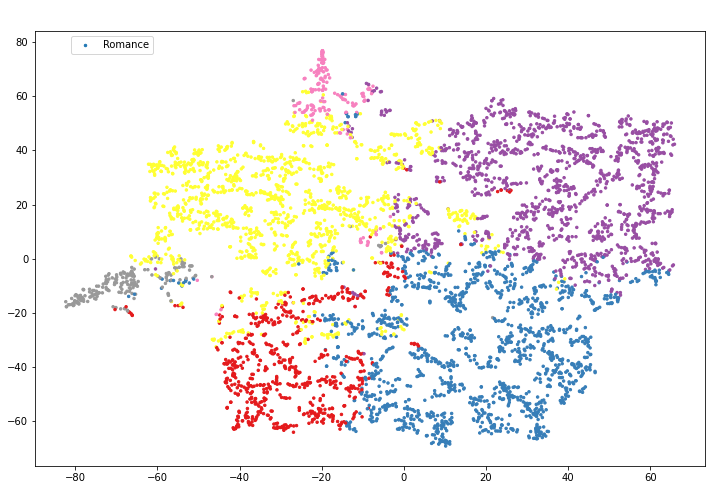

In [116]:
fig, ax = plt.subplots(figsize=(12,8))

ax.scatter(x=tsne_embedding.x,y=tsne_embedding.y,s=6,c=tsne_embedding.hue,cmap="Set1")
fig.legend(['Romance', 'Introspective_y', 'Old School Gangsta Rap','Club (Materialistic)', 'New School Gangsta Rap', 'Mumble '],loc=(0.1,0.89),ncol=3)

In [95]:
songdf.iloc[songdf.Introspective_y.sort_values(ascending=False).index]

,Artist,Song,Lyrics,ID,Audio_Features,acousticness,analysis_url,danceability,duration_ms,energy,...,type,uri,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap,subgenre
4948,Joyner Lucas,Forever,"Yo, I know you don't understand my words But ...",62FOgkuJaSPZlHUB7Gb7dt,"{'danceability': 0.644, 'energy': 0.547, 'key'...",0.8350,https://api.spotify.com/v1/audio-analysis/62FO...,0.644,343234.0,0.547,...,audio_features,spotify:track:62FOgkuJaSPZlHUB7Gb7dt,0.280,0.106580,0.000000,0.008015,0.000000,0.000000,0.000000,Introspective_y
3687,Diddy,Best Friend,I've seen a lot of things in my life Alot of...,7Gfzoer3tsu6AVTce0TwSM,"{'danceability': 0.627, 'energy': 0.729, 'key'...",0.4730,https://api.spotify.com/v1/audio-analysis/7Gfz...,0.627,334646.0,0.729,...,audio_features,spotify:track:7Gfzoer3tsu6AVTce0TwSM,0.494,0.105899,0.000000,0.010418,0.000000,0.000122,0.000000,Introspective_y
4927,Joyner Lucas,Devil’s Work,"Father, forgive me I'm staring at this Bibl...",3FpmWMmuQfQLpyVD7t5CCE,"{'danceability': 0.575, 'energy': 0.746, 'key'...",0.1420,https://api.spotify.com/v1/audio-analysis/3Fpm...,0.575,285048.0,0.746,...,audio_features,spotify:track:3FpmWMmuQfQLpyVD7t5CCE,0.235,0.105001,0.007354,0.000000,0.000000,0.008972,0.003429,Introspective_y
3875,Mac Miller,Objects In the Mirror,Can you turn the beat up? A little louder The...,64gyqTtDDel7B2NoEkOa0A,"{'danceability': 0.645, 'energy': 0.658, 'key'...",0.6230,https://api.spotify.com/v1/audio-analysis/64gy...,0.645,259144.0,0.658,...,audio_features,spotify:track:64gyqTtDDel7B2NoEkOa0A,0.190,0.103387,0.000000,0.036541,0.000000,0.000000,0.000000,Introspective_y
4377,Joe Budden,More of Me,I give you my all But it seems like that's ...,13F9BKar84b7qMAIxbuCPr,"{'danceability': 0.365, 'energy': 0.76, 'key':...",0.1980,https://api.spotify.com/v1/audio-analysis/13F9...,0.365,426710.0,0.760,...,audio_features,spotify:track:13F9BKar84b7qMAIxbuCPr,0.288,0.100626,0.001940,0.012685,0.000219,0.005493,0.000000,Introspective_y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1199,YG,HANDGUN,"I mix the 4Hunnid with the designer, nigga St...",50wkDxcIfamIajKwmgp0iB,"{'danceability': 0.843, 'energy': 0.546, 'key'...",0.0195,https://api.spotify.com/v1/audio-analysis/50wk...,0.843,215533.0,0.546,...,audio_features,spotify:track:50wkDxcIfamIajKwmgp0iB,0.427,0.000000,0.031369,0.006022,0.015511,0.026732,0.050990,New School Gangsta Rap
1200,YG,I’m Good,"First off, this beat bang Ask around, I'm the...",7GG1QIQ547taCwl1uLaTf5,"{'danceability': 0.925, 'energy': 0.354, 'key'...",0.0137,https://api.spotify.com/v1/audio-analysis/7GG1...,0.925,172773.0,0.354,...,audio_features,spotify:track:7GG1QIQ547taCwl1uLaTf5,0.405,0.000000,0.065949,0.024640,0.031626,0.016960,0.013286,Club (Materialistic)
3488,Redman,Smoke Buddah,"Aiyyo, I got a slight problem I smoke weed to...",3eY9pixHny3kVRLeqNezQx,"{'danceability': 0.552, 'energy': 0.731, 'key'...",0.0946,https://api.spotify.com/v1/audio-analysis/3eY9...,0.552,154480.0,0.731,...,audio_features,spotify:track:3eY9pixHny3kVRLeqNezQx,0.847,0.000000,0.027806,0.009788,0.000000,0.031562,0.000197,Old School Gangsta Rap
3489,Redman,Funkorama,"We, hah! This is Funk Doctor Spot! As we look...",7DRLt7ciofFgZp4m8b8Z4z,"{'danceability': 0.603, 'energy': 0.845, 'key'...",0.0106,https://api.spotify.com/v1/audio-analysis/7DRL...,0.603,183307.0,0.845,...,audio_features,spotify:track:7DRLt7ciofFgZp4m8b8Z4z,0.824,0.000000,0.000794,0.000000,0.000000,0.069663,0.000000,Old School Gangsta Rap


In [261]:
# add labels (summarize themes)
# supervised learning
# billboard 

In [125]:
from sklearn.decomposition import NMF as NMF_sklearn
import ast

In [128]:
def get_dict(s):
    s = s.lstrip('[')
    s = s.rstrip(']')
  
    res = ast.literal_eval(s) 

    # print result 
    return res
    

In [130]:
songdf.Audio_Features = songdf.Audio_Features.apply(lambda x: get_dict(x) if type(x) == str else x) 

In [2]:
songdf.idxmax(axis=1)

NameError: name 'songdf' is not defined

In [144]:
type(pd.Series(songdf.Audio_Features[0]))

pandas.core.series.Series

In [143]:
type(songdf.iloc[0])

pandas.core.series.Series

In [179]:
pd.concat([pd.concat([pd.Series(songdf.Audio_Features[0]),pd.Series(songdf.Audio_Features[1])],axis=1),pd.Series(songdf.Audio_Features[4871])],axis=1).T

,0,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,NaN,0.0685,https://api.spotify.com/v1/audio-analysis/4qik...,0.563,329320,0.496,4qikXelSRKvoCqFcHLB2H2,5.8e-05,6,0.173,-9.381,0,0.406,139.993,4,https://api.spotify.com/v1/tracks/4qikXelSRKvo...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.426
1,NaN,0.118,https://api.spotify.com/v1/audio-analysis/4KW1...,0.724,135920,0.573,4KW1lqgSr8TKrvBII0Brf8,0,7,0.538,-4.113,1,0.0549,113.088,4,https://api.spotify.com/v1/tracks/4KW1lqgSr8TK...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.438
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [182]:
def make_db(series):
    df = pd.concat([pd.Series(series[0]),pd.Series(series[1])],axis=1)
    for i in range(2,len(series)):
        df = pd.concat([df,pd.Series(series[i])],axis=1)
    
    return df.T

In [183]:
len(songdf.Audio_Features)

5362

In [185]:
elementdb = make_db(songdf.Audio_Features)

In [187]:
elementdb.drop(0,axis=1,inplace=True)

In [189]:
elementdb.reset_index(inplace=True)
elementdb

,index,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,0,0.0685,https://api.spotify.com/v1/audio-analysis/4qik...,0.563,329320,0.496,4qikXelSRKvoCqFcHLB2H2,5.8e-05,6,0.173,-9.381,0,0.406,139.993,4,https://api.spotify.com/v1/tracks/4qikXelSRKvo...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.426
1,1,0.118,https://api.spotify.com/v1/audio-analysis/4KW1...,0.724,135920,0.573,4KW1lqgSr8TKrvBII0Brf8,0,7,0.538,-4.113,1,0.0549,113.088,4,https://api.spotify.com/v1/tracks/4KW1lqgSr8TK...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.438
2,0,0.00244,https://api.spotify.com/v1/audio-analysis/1ZHY...,0.628,378893,0.692,1ZHYJ2Wwgxes4m8Ba88PeK,0.0129,2,0.668,-5.64,1,0.202,124.887,5,https://api.spotify.com/v1/tracks/1ZHYJ2Wwgxes...,audio_features,spotify:track:1ZHYJ2Wwgxes4m8Ba88PeK,0.0963
3,0,0.62,https://api.spotify.com/v1/audio-analysis/1eQB...,0.592,320680,0.403,1eQBEelI2NCy7AUTerX0KS,0,0,0.54,-8.768,0,0.414,105.169,4,https://api.spotify.com/v1/tracks/1eQBEelI2NCy...,audio_features,spotify:track:1eQBEelI2NCy7AUTerX0KS,0.391
4,0,0.145,https://api.spotify.com/v1/audio-analysis/3sNV...,0.367,229147,0.665,3sNVsP50132BTNlImLx70i,0,1,0.113,-2.821,1,0.0465,148.913,4,https://api.spotify.com/v1/tracks/3sNVsP50132B...,audio_features,spotify:track:3sNVsP50132BTNlImLx70i,0.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5357,0,0.128,https://api.spotify.com/v1/audio-analysis/3NqC...,0.71,195587,0.49,3NqCEpT8xsHdzpiRlM1kpS,0,1,0.0942,-9.832,1,0.246,74.351,4,https://api.spotify.com/v1/tracks/3NqCEpT8xsHd...,audio_features,spotify:track:3NqCEpT8xsHdzpiRlM1kpS,0.621
5358,0,0.149,https://api.spotify.com/v1/audio-analysis/2iP3...,0.776,204000,0.64,2iP3unJbxZvRuqyrS0ocZy,0,7,0.101,-8.058,1,0.184,160.038,4,https://api.spotify.com/v1/tracks/2iP3unJbxZvR...,audio_features,spotify:track:2iP3unJbxZvRuqyrS0ocZy,0.326
5359,0,0.212,https://api.spotify.com/v1/audio-analysis/7caP...,0.754,192080,0.597,7caP3UAf8ZtIMVpWfEIA4H,0,7,0.0866,-7.809,1,0.38,150.089,4,https://api.spotify.com/v1/tracks/7caP3UAf8ZtI...,audio_features,spotify:track:7caP3UAf8ZtIMVpWfEIA4H,0.347
5360,0,0.0919,https://api.spotify.com/v1/audio-analysis/40j4...,0.807,176575,0.665,40j4RoqmLiivqzRObbQ4BF,0,5,0.0788,-5.249,0,0.276,164.964,4,https://api.spotify.com/v1/tracks/40j4RoqmLiiv...,audio_features,spotify:track:40j4RoqmLiivqzRObbQ4BF,0.557


In [191]:
elementdb.drop('index',axis=1,inplace=True)
elementdb

,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,0.0685,https://api.spotify.com/v1/audio-analysis/4qik...,0.563,329320,0.496,4qikXelSRKvoCqFcHLB2H2,5.8e-05,6,0.173,-9.381,0,0.406,139.993,4,https://api.spotify.com/v1/tracks/4qikXelSRKvo...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.426
1,0.118,https://api.spotify.com/v1/audio-analysis/4KW1...,0.724,135920,0.573,4KW1lqgSr8TKrvBII0Brf8,0,7,0.538,-4.113,1,0.0549,113.088,4,https://api.spotify.com/v1/tracks/4KW1lqgSr8TK...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.438
2,0.00244,https://api.spotify.com/v1/audio-analysis/1ZHY...,0.628,378893,0.692,1ZHYJ2Wwgxes4m8Ba88PeK,0.0129,2,0.668,-5.64,1,0.202,124.887,5,https://api.spotify.com/v1/tracks/1ZHYJ2Wwgxes...,audio_features,spotify:track:1ZHYJ2Wwgxes4m8Ba88PeK,0.0963
3,0.62,https://api.spotify.com/v1/audio-analysis/1eQB...,0.592,320680,0.403,1eQBEelI2NCy7AUTerX0KS,0,0,0.54,-8.768,0,0.414,105.169,4,https://api.spotify.com/v1/tracks/1eQBEelI2NCy...,audio_features,spotify:track:1eQBEelI2NCy7AUTerX0KS,0.391
4,0.145,https://api.spotify.com/v1/audio-analysis/3sNV...,0.367,229147,0.665,3sNVsP50132BTNlImLx70i,0,1,0.113,-2.821,1,0.0465,148.913,4,https://api.spotify.com/v1/tracks/3sNVsP50132B...,audio_features,spotify:track:3sNVsP50132BTNlImLx70i,0.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5357,0.128,https://api.spotify.com/v1/audio-analysis/3NqC...,0.71,195587,0.49,3NqCEpT8xsHdzpiRlM1kpS,0,1,0.0942,-9.832,1,0.246,74.351,4,https://api.spotify.com/v1/tracks/3NqCEpT8xsHd...,audio_features,spotify:track:3NqCEpT8xsHdzpiRlM1kpS,0.621
5358,0.149,https://api.spotify.com/v1/audio-analysis/2iP3...,0.776,204000,0.64,2iP3unJbxZvRuqyrS0ocZy,0,7,0.101,-8.058,1,0.184,160.038,4,https://api.spotify.com/v1/tracks/2iP3unJbxZvR...,audio_features,spotify:track:2iP3unJbxZvRuqyrS0ocZy,0.326
5359,0.212,https://api.spotify.com/v1/audio-analysis/7caP...,0.754,192080,0.597,7caP3UAf8ZtIMVpWfEIA4H,0,7,0.0866,-7.809,1,0.38,150.089,4,https://api.spotify.com/v1/tracks/7caP3UAf8ZtI...,audio_features,spotify:track:7caP3UAf8ZtIMVpWfEIA4H,0.347
5360,0.0919,https://api.spotify.com/v1/audio-analysis/40j4...,0.807,176575,0.665,40j4RoqmLiivqzRObbQ4BF,0,5,0.0788,-5.249,0,0.276,164.964,4,https://api.spotify.com/v1/tracks/40j4RoqmLiiv...,audio_features,spotify:track:40j4RoqmLiivqzRObbQ4BF,0.557


In [192]:
elementdb.to_csv('data/elements.csv',index=False)

In [194]:
df = songdf.merge(elementdb,left_index=True,right_index=True)
df

,Artist,Song,Lyrics,ID,Audio_Features,Introspective,Club(Pleasures),Love/Sex,Mumble/New Age,Street/Gangsta Rap,...,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence
0,Kanye West,Mercy,"Well, it is a weepin' and a moanin' and a gna...",4qikXelSRKvoCqFcHLB2H2,"{'danceability': 0.563, 'energy': 0.496, 'key'...",0.000756,0.018351,0.022510,0.000000,0.010649,...,0.173,-9.381,0,0.406,139.993,4,https://api.spotify.com/v1/tracks/4qikXelSRKvo...,audio_features,spotify:track:4qikXelSRKvoCqFcHLB2H2,0.426
1,Kanye West,"Father Stretch My Hands, Pt. 1",You're the only power You're the only power ...,4KW1lqgSr8TKrvBII0Brf8,"{'danceability': 0.724, 'energy': 0.573, 'key'...",0.023646,0.004200,0.019006,0.000000,0.000000,...,0.538,-4.113,1,0.0549,113.088,4,https://api.spotify.com/v1/tracks/4KW1lqgSr8TK...,audio_features,spotify:track:4KW1lqgSr8TKrvBII0Brf8,0.438
2,Kanye West,Monster,I shoot the lights out Hide 'til it's bright ...,1ZHYJ2Wwgxes4m8Ba88PeK,"{'danceability': 0.628, 'energy': 0.692, 'key'...",0.024095,0.019531,0.009372,0.005490,0.035623,...,0.668,-5.64,1,0.202,124.887,5,https://api.spotify.com/v1/tracks/1ZHYJ2Wwgxes...,audio_features,spotify:track:1ZHYJ2Wwgxes4m8Ba88PeK,0.0963
3,Kanye West,Ultralight Beam,"We don't want no devils in the house, God W...",1eQBEelI2NCy7AUTerX0KS,"{'danceability': 0.592, 'energy': 0.403, 'key'...",0.081702,0.000000,0.000000,0.003375,0.000000,...,0.54,-8.768,0,0.414,105.169,4,https://api.spotify.com/v1/tracks/1eQBEelI2NCy...,audio_features,spotify:track:1eQBEelI2NCy7AUTerX0KS,0.391
4,Kanye West,Bound 2,B-B-B-B-Bound to fall in love Bound to fall i...,3sNVsP50132BTNlImLx70i,"{'danceability': 0.367, 'energy': 0.665, 'key'...",0.012735,0.004414,0.068182,0.003425,0.004778,...,0.113,-2.821,1,0.0465,148.913,4,https://api.spotify.com/v1/tracks/3sNVsP50132B...,audio_features,spotify:track:3sNVsP50132BTNlImLx70i,0.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5357,Polo G,Through da Storm,"Hey big brother, it's me, Leia Remember at th...",3NqCEpT8xsHdzpiRlM1kpS,"{'danceability': 0.71, 'energy': 0.49, 'key': ...",0.044536,0.033469,0.000061,0.007006,0.000000,...,0.0942,-9.832,1,0.246,74.351,4,https://api.spotify.com/v1/tracks/3NqCEpT8xsHd...,audio_features,spotify:track:3NqCEpT8xsHdzpiRlM1kpS,0.621
5358,Polo G,Heartless,"My youngins heartless, so they ain't playi...",2iP3unJbxZvRuqyrS0ocZy,"{'danceability': 0.776, 'energy': 0.64, 'key':...",0.032030,0.036410,0.008285,0.014614,0.006375,...,0.101,-8.058,1,0.184,160.038,4,https://api.spotify.com/v1/tracks/2iP3unJbxZvR...,audio_features,spotify:track:2iP3unJbxZvRuqyrS0ocZy,0.326
5359,Polo G,Battle Cry,JTK I know these niggas never been a hundre...,7caP3UAf8ZtIMVpWfEIA4H,"{'danceability': 0.754, 'energy': 0.597, 'key'...",0.037670,0.041758,0.000000,0.004303,0.007571,...,0.0866,-7.809,1,0.38,150.089,4,https://api.spotify.com/v1/tracks/7caP3UAf8ZtI...,audio_features,spotify:track:7caP3UAf8ZtIMVpWfEIA4H,0.347
5360,Polo G,I Know,"Bondin' over drugs and pain, dirty Sprit...",40j4RoqmLiivqzRObbQ4BF,"{'danceability': 0.807, 'energy': 0.665, 'key'...",0.058163,0.015345,0.011520,0.000881,0.000039,...,0.0788,-5.249,0,0.276,164.964,4,https://api.spotify.com/v1/tracks/40j4RoqmLiiv...,audio_features,spotify:track:40j4RoqmLiivqzRObbQ4BF,0.557


In [195]:
df.to_csv('data/final_db.csv',index=False)

In [199]:
df.dtypes

Artist                 object
Song                   object
Lyrics                 object
ID                     object
Audio_Features         object
Introspective         float32
Club(Pleasures)       float32
Love/Sex              float32
Mumble/New Age        float32
Street/Gangsta Rap    float32
acousticness           object
analysis_url           object
danceability           object
duration_ms            object
energy                 object
id                     object
instrumentalness       object
key                    object
liveness               object
loudness               object
mode                   object
speechiness            object
tempo                  object
time_signature         object
track_href             object
type                   object
uri                    object
valence                object
dtype: object

In [218]:
df.acousticness = df.acousticness.astype(float)
df.danceability = df.danceability.astype(float)
df.duration_ms = df.duration_ms.astype(float)
df.energy = df.energy.astype(float)
df.instrumentalness = df.instrumentalness.astype(float)
df.key = df.key.astype(float)
df.liveness = df.liveness.astype(float)
df.loudness = df.loudness.astype(float)
df['mode'] = df['mode'].astype(float)
df.speechiness = df.speechiness.astype(float)
df.tempo = df.tempo.astype(float)
df.time_signature = df.time_signature.astype(float)
df.valence = df.valence.astype(float)

In [219]:
df.to_pickle('data/finaldb.pkl')

In [220]:
df.describe()

,Introspective,Club(Pleasures),Love/Sex,Mumble/New Age,Street/Gangsta Rap,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,5362.000000,5362.000000,5362.000000,5362.000000,5362.000000,4672.000000,4672.000000,4.672000e+03,4672.000000,4672.000000,4672.000000,4672.000000,4672.000000,4672.000000,4672.000000,4672.000000,4672.000000,4672.000000
mean,0.022306,0.020811,0.015117,0.005686,0.020633,0.161283,0.696939,2.372502e+05,0.672858,0.013113,5.366866,0.227076,-6.930996,0.557791,0.239711,118.206177,3.988014,0.497787
std,0.021386,0.020911,0.022521,0.023376,0.022306,0.191727,0.145581,6.936105e+04,0.158219,0.090650,3.729255,0.174533,2.966843,0.496702,0.143256,31.358896,0.312903,0.218005
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000017,0.089000,2.153300e+04,0.000282,0.000000,0.000000,0.013600,-49.869000,0.000000,0.022900,55.963000,1.000000,0.033700
25%,0.004046,0.002679,0.000000,0.000000,0.001754,0.025800,0.598000,1.975518e+05,0.568000,0.000000,1.000000,0.104000,-8.206250,0.000000,0.117000,91.875250,4.000000,0.332000
50%,0.017025,0.015398,0.006472,0.000000,0.013128,0.088050,0.716000,2.335000e+05,0.686500,0.000000,6.000000,0.156000,-6.420500,1.000000,0.241000,112.001000,4.000000,0.502000
75%,0.034838,0.032927,0.019972,0.001774,0.032492,0.224000,0.807000,2.711382e+05,0.789000,0.000004,9.000000,0.313000,-5.041000,1.000000,0.333000,140.104250,4.000000,0.669000
max,0.107598,0.124650,0.196128,0.431413,0.129677,0.991000,0.982000,1.043918e+06,0.998000,0.973000,11.000000,0.973000,0.175000,1.000000,0.947000,210.618000,5.000000,0.974000


In [668]:
songdf.groupby('Artist').mean().sort_values('Introspective_y',ascending=False)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
Artist,,,,,,,,,,,,,,,,,,,
Joe Budden,0.187964,0.477871,363813.774194,0.718516,8.485806e-06,5.161290,0.199874,-6.948258,0.483871,0.248910,111.647806,3.903226,0.407129,0.061975,0.011334,0.019023,0.000887,0.015531,0.001372
Logic,0.180904,0.684490,277022.571429,0.765204,1.255304e-03,5.489796,0.205898,-6.020735,0.408163,0.169404,123.370061,4.000000,0.521467,0.049004,0.013372,0.008298,0.002981,0.015979,0.007932
Joyner Lucas,0.343274,0.713892,265749.756757,0.685405,4.021703e-05,6.216216,0.286981,-6.922405,0.540541,0.342900,110.036189,3.783784,0.453162,0.046826,0.024575,0.016449,0.007179,0.010098,0.010958
Eminem,0.125427,0.735306,299268.183673,0.764449,1.845020e-05,5.265306,0.286082,-4.687265,0.489796,0.254718,121.822816,4.020408,0.493551,0.044600,0.010434,0.011889,0.001210,0.024376,0.001945
Scarface,0.113674,0.711702,249439.212766,0.724957,2.382275e-03,4.914894,0.209766,-6.603170,0.468085,0.257140,101.991383,3.936170,0.526894,0.044249,0.015232,0.004069,0.000346,0.027708,0.003772
Mac Miller,0.415518,0.609404,268554.574468,0.534630,9.785430e-03,4.893617,0.217930,-8.158191,0.595745,0.175751,116.917213,4.000000,0.344613,0.043901,0.015568,0.019905,0.005157,0.007823,0.000780
J. Cole,0.300796,0.666160,249136.100000,0.588620,5.416572e-03,5.580000,0.219360,-8.676940,0.580000,0.283868,115.607980,3.980000,0.381030,0.043866,0.015489,0.016498,0.007205,0.011324,0.001362
Machine Gun Kelly,0.086091,0.678730,214050.891892,0.690324,8.800176e-03,5.378378,0.174041,-6.189081,0.405405,0.116795,122.741730,4.000000,0.333576,0.041616,0.012497,0.010843,0.004470,0.008222,0.004278
2Pac,0.149668,0.784977,271857.395349,0.718605,4.099103e-03,5.604651,0.199635,-6.295023,0.604651,0.215198,99.726233,4.000000,0.684674,0.040848,0.005753,0.011590,0.000371,0.028659,0.002357


In [671]:
songdf.groupby('Artist').mean().sort_values('Club (Materialistic)',ascending=False)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
Artist,,,,,,,,,,,,,,,,,,,
Lil Baby,0.060993,0.752460,189755.860000,0.567980,3.438220e-05,5.820000,0.149356,-6.856020,0.540000,0.262004,126.955560,4.020000,0.349748,0.025124,0.051716,0.008523,0.001393,0.005564,0.016245
DaBaby,0.088181,0.819809,156683.212766,0.666957,2.954043e-06,4.957447,0.185387,-5.801915,0.574468,0.292191,128.355894,3.978723,0.650447,0.014856,0.051411,0.020517,0.006912,0.011273,0.004525
Gunna,0.291500,0.881300,186850.700000,0.525200,1.950000e-05,3.400000,0.120940,-7.984900,0.800000,0.290170,131.988900,4.000000,0.524200,0.012007,0.050959,0.006657,0.002731,0.005801,0.014698
Meek Mill,0.111776,0.634956,237742.311111,0.681178,1.398578e-05,5.222222,0.261624,-6.406311,0.644444,0.292771,120.765044,3.955556,0.365424,0.026977,0.048954,0.011412,0.003034,0.008821,0.003830
Roddy Ricch,0.137733,0.818444,191740.111111,0.586778,4.688889e-05,5.222222,0.230178,-7.381889,0.333333,0.210567,118.682667,3.888889,0.422556,0.014147,0.048061,0.008841,0.011425,0.006328,0.006109
Young Thug,0.104755,0.773933,243651.666667,0.558778,2.108895e-02,5.800000,0.175620,-7.599578,0.377778,0.246278,122.455756,4.000000,0.409600,0.007591,0.047366,0.019846,0.030876,0.005851,0.008680
Playboi Carti,0.116368,0.778500,178211.000000,0.621722,1.789972e-05,4.944444,0.222656,-6.534056,0.527778,0.220847,133.499250,4.000000,0.418611,0.001422,0.046706,0.010399,0.023275,0.002421,0.004604
Megan Thee Stallion,0.046794,0.852625,174697.729167,0.724729,5.750042e-05,4.750000,0.162579,-5.509146,0.729167,0.252925,127.404375,4.000000,0.564562,0.005410,0.046075,0.023860,0.055873,0.005719,0.002078
Juicy J,0.095209,0.819023,227537.395349,0.681428,2.365701e-02,5.279070,0.194719,-6.792163,0.674419,0.209147,136.397837,3.976744,0.521105,0.004866,0.043855,0.010918,0.000704,0.005576,0.004038


In [672]:
songdf.groupby('Artist').mean().sort_values('Mumble ',ascending=False)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
Artist,,,,,,,,,,,,,,,,,,,
Ski Mask the Slump God,0.156411,0.851556,151969.666667,0.628556,1.666667e-07,6.000000,0.289489,-7.259889,0.555556,0.256778,124.647444,4.000000,0.705111,0.001890,0.024688,0.004406,0.078583,0.004496,0.007541
Lil Skies,0.238740,0.721500,192058.100000,0.670600,8.124430e-02,5.100000,0.173470,-7.251100,0.700000,0.153770,132.599200,4.000000,0.555600,0.026650,0.024908,0.030872,0.073147,0.001865,0.004341
Megan Thee Stallion,0.046794,0.852625,174697.729167,0.724729,5.750042e-05,4.750000,0.162579,-5.509146,0.729167,0.252925,127.404375,4.000000,0.564562,0.005410,0.046075,0.023860,0.055873,0.005719,0.002078
Trippie Redd,0.268390,0.690708,181053.708333,0.573812,5.583273e-03,5.500000,0.151294,-7.967062,0.437500,0.123923,125.775062,3.979167,0.391250,0.012720,0.018048,0.030596,0.054308,0.005080,0.018151
Fivio Foreign,0.096288,0.719125,199434.250000,0.734125,4.080000e-06,2.500000,0.215863,-5.794125,0.750000,0.319238,131.427875,3.625000,0.500000,0.008370,0.022945,0.008035,0.044598,0.008284,0.015949
Cordae,0.196189,0.755111,188590.777778,0.593556,3.011111e-06,4.333333,0.160100,-7.290111,0.555556,0.398444,124.624667,4.000000,0.460333,0.024394,0.029847,0.007116,0.033755,0.011289,0.003825
Chief Keef,0.148253,0.666489,199525.888889,0.658044,1.106844e-05,5.533333,0.250407,-6.749778,0.511111,0.180867,131.994044,4.022222,0.424929,0.005796,0.033049,0.009716,0.032896,0.005655,0.034523
Young Thug,0.104755,0.773933,243651.666667,0.558778,2.108895e-02,5.800000,0.175620,-7.599578,0.377778,0.246278,122.455756,4.000000,0.409600,0.007591,0.047366,0.019846,0.030876,0.005851,0.008680
XXXTENTACION,0.466857,0.680000,135125.414634,0.436678,3.706067e-02,5.731707,0.140154,-9.279049,0.512195,0.179010,115.579098,4.000000,0.433322,0.024801,0.006544,0.016392,0.026345,0.003810,0.003421


In [673]:
songdf.groupby('Artist').mean().sort_values('Romance',ascending=False)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
Artist,,,,,,,,,,,,,,,,,,,
PnB Rock,0.123201,0.671222,222960.444444,0.606556,1.322222e-07,5.111111,0.200711,-7.277889,0.444444,0.105078,119.486778,4.000000,0.298167,0.018940,0.012966,0.062475,0.002742,0.000000,0.000000
Bow Wow,0.157758,0.738059,230745.294118,0.659559,9.117797e-04,5.176471,0.245118,-6.840824,0.558824,0.251071,117.059765,4.029412,0.641988,0.021166,0.022276,0.041074,0.002039,0.014663,0.003426
Lil Peep,0.100711,0.586972,194816.055556,0.618250,2.781760e-02,4.583333,0.160553,-7.054500,0.611111,0.056208,118.711111,3.972222,0.294786,0.030477,0.012803,0.035628,0.009600,0.002260,0.001943
Ma$e,0.370757,0.573382,293149.941176,0.569764,2.578472e-01,5.558824,0.262409,-10.870618,0.735294,0.159041,119.847412,3.970588,0.539609,0.020045,0.015670,0.034892,0.000546,0.031682,0.000250
KYLE,0.214650,0.639400,214255.300000,0.659400,1.626000e-06,3.900000,0.211520,-6.407900,0.500000,0.312000,108.130200,3.900000,0.575000,0.026420,0.009400,0.032469,0.003921,0.007677,0.001460
Nelly,0.107067,0.738708,249144.541667,0.662771,1.132646e-02,5.166667,0.208827,-6.583646,0.562500,0.158075,125.468917,4.000000,0.586548,0.019030,0.014694,0.031764,0.002533,0.015576,0.001277
Lil Skies,0.238740,0.721500,192058.100000,0.670600,8.124430e-02,5.100000,0.173470,-7.251100,0.700000,0.153770,132.599200,4.000000,0.555600,0.026650,0.024908,0.030872,0.073147,0.001865,0.004341
Trippie Redd,0.268390,0.690708,181053.708333,0.573812,5.583273e-03,5.500000,0.151294,-7.967062,0.437500,0.123923,125.775062,3.979167,0.391250,0.012720,0.018048,0.030596,0.054308,0.005080,0.018151
LL Cool J,0.111518,0.770455,267442.068182,0.649841,5.000464e-02,5.500000,0.193184,-9.902318,0.500000,0.260573,119.781932,4.000000,0.637841,0.012992,0.005739,0.030506,0.000398,0.034843,0.000807


In [674]:
songdf.groupby('Artist').mean().sort_values('Old School Gangsta Rap',ascending=False)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
Artist,,,,,,,,,,,,,,,,,,,
Big L,0.164741,0.721897,230736.666667,0.655538,4.176573e-02,6.564103,0.255708,-9.209487,0.615385,0.332246,122.362077,3.897436,0.718385,0.009365,0.010266,0.008400,0.000829,0.068025,0.000709
Kool G Rap,0.163180,0.697511,244599.400000,0.791622,7.650196e-04,5.644444,0.221211,-6.218933,0.622222,0.307142,108.926978,4.000000,0.637867,0.007685,0.011302,0.004450,0.000183,0.060885,0.002882
Mobb Deep,0.157369,0.723978,255174.217391,0.719043,6.704674e-05,6.021739,0.187663,-6.301435,0.565217,0.330283,109.002174,4.000000,0.558522,0.022948,0.005527,0.006912,0.000498,0.059328,0.000768
Big Daddy Kane,0.121109,0.780511,255079.680851,0.599596,5.676671e-03,6.617021,0.219994,-12.276277,0.382979,0.297111,107.666106,3.936170,0.683404,0.017081,0.001787,0.016998,0.000862,0.055710,0.000153
N.W.A,0.127465,0.772524,231499.285714,0.741619,9.989583e-03,7.500000,0.315536,-7.828000,0.523810,0.304612,120.404500,3.928571,0.649524,0.008687,0.017752,0.007190,0.001038,0.053934,0.003415
Redman,0.105172,0.692907,215432.627907,0.729419,1.325472e-02,5.906977,0.287940,-8.028372,0.534884,0.405907,110.677326,4.023256,0.686674,0.002578,0.014006,0.004801,0.000392,0.053635,0.001033
Run-D.M.C.,0.052685,0.822761,240672.195652,0.764087,7.531204e-04,5.586957,0.216463,-8.719696,0.543478,0.213230,119.749326,3.978261,0.641891,0.013525,0.002272,0.005402,0.001529,0.048001,0.001404
Raekwon,0.200004,0.620864,221709.522727,0.724136,5.434122e-03,5.909091,0.313311,-7.128955,0.409091,0.337450,108.938409,4.000000,0.585250,0.015790,0.012975,0.006853,0.002140,0.047732,0.001550
Big Pun,0.183215,0.687810,212962.309524,0.753024,4.635536e-03,4.333333,0.217200,-5.883857,0.523810,0.320286,104.884167,4.000000,0.608286,0.015669,0.006671,0.008062,0.000386,0.047430,0.001269


In [675]:
songdf.groupby('Artist').mean().sort_values('New School Gangsta Rap',ascending=False)

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap
Artist,,,,,,,,,,,,,,,,,,,
Lil Pump,0.112094,0.846410,150075.589744,0.547051,4.673000e-05,4.564103,0.175526,-7.187949,0.846154,0.171797,135.274744,4.000000,0.520813,0.002269,0.028528,0.002040,0.020067,0.001044,0.056849
Blueface,0.198040,0.855900,154290.100000,0.567700,0.000000e+00,7.700000,0.169160,-8.467200,0.300000,0.380600,104.386900,3.900000,0.470700,0.002595,0.020897,0.013519,0.002530,0.012231,0.054842
21 Savage,0.092767,0.831070,220976.325581,0.535023,3.270256e-02,5.232558,0.171437,-8.461605,0.465116,0.293230,131.046047,4.000000,0.350458,0.014467,0.038245,0.008817,0.005569,0.008331,0.053818
Polo G,0.146267,0.752111,178659.777778,0.557111,2.500000e-05,4.333333,0.103711,-8.825667,0.777778,0.333889,144.620667,4.000000,0.348889,0.033433,0.030585,0.011172,0.012162,0.007133,0.045588
Chief Keef,0.148253,0.666489,199525.888889,0.658044,1.106844e-05,5.533333,0.250407,-6.749778,0.511111,0.180867,131.994044,4.022222,0.424929,0.005796,0.033049,0.009716,0.032896,0.005655,0.034523
6ix9ine,0.107099,0.735789,151016.552632,0.725526,1.888958e-03,5.052632,0.191663,-5.394421,0.578947,0.199361,119.928474,3.973684,0.515237,0.005442,0.032653,0.009825,0.011875,0.010357,0.030957
Migos,0.119301,0.835979,253535.553191,0.664128,6.102128e-07,4.702128,0.171517,-5.537298,0.659574,0.186366,133.233191,4.000000,0.435279,0.006656,0.035855,0.004021,0.005997,0.004791,0.023019
Wiz Khalifa,0.130279,0.705500,238077.761905,0.709476,1.374778e-03,5.380952,0.276498,-5.792452,0.642857,0.125769,134.713500,3.976190,0.451524,0.017234,0.034436,0.012920,0.004092,0.005954,0.018272
Trippie Redd,0.268390,0.690708,181053.708333,0.573812,5.583273e-03,5.500000,0.151294,-7.967062,0.437500,0.123923,125.775062,3.979167,0.391250,0.012720,0.018048,0.030596,0.054308,0.005080,0.018151


In [676]:
songdf[songdf['subgenre']=='Mumble ']

,Artist,Song,Lyrics,ID,Audio_Features,acousticness,analysis_url,danceability,duration_ms,energy,id,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,track_href,type,uri,valence,Introspective_y,Club (Materialistic),Romance,Mumble,Old School Gangsta Rap,New School Gangsta Rap,subgenre
8,Kanye West,All Mine,"Yeah, you supermodel thick Damn, that ass bus...",3U21A07gAloCc4P7J8rxcn,"{'danceability': 0.925, 'energy': 0.31, 'key':...",0.123000,https://api.spotify.com/v1/audio-analysis/3U21...,0.925,145507.0,0.310,3U21A07gAloCc4P7J8rxcn,0.000000,11.0,0.0931,-6.531,0.0,0.2910,121.927,4.0,https://api.spotify.com/v1/tracks/3U21A07gAloC...,audio_features,spotify:track:3U21A07gAloCc4P7J8rxcn,0.2910,7.275498e-03,0.009898,0.012255,0.121432,0.000000,0.000000,Mumble
23,Kanye West,All Day,"All day, nigga Dance, ayy, ayy ayy ayy All ...",79reBHqpRoWXaQbjBBY3UC,"{'danceability': 0.861, 'energy': 0.651, 'key'...",0.073900,https://api.spotify.com/v1/audio-analysis/79re...,0.861,310907.0,0.651,79reBHqpRoWXaQbjBBY3UC,0.000000,9.0,0.2110,-4.718,0.0,0.1110,122.985,4.0,https://api.spotify.com/v1/tracks/79reBHqpRoWX...,audio_features,spotify:track:79reBHqpRoWXaQbjBBY3UC,0.4210,3.700628e-02,0.011676,0.003306,0.082562,0.001341,0.000000,Mumble
42,Kanye West,30 Hours,Baby lion goes Where the islands go You say...,2CHmgtK8OCL28WtIK96u4N,"{'danceability': 0.823, 'energy': 0.813, 'key'...",0.035900,https://api.spotify.com/v1/audio-analysis/2CHm...,0.823,323303.0,0.813,2CHmgtK8OCL28WtIK96u4N,0.000000,7.0,0.0886,-6.710,1.0,0.2880,95.012,4.0,https://api.spotify.com/v1/tracks/2CHmgtK8OCL2...,audio_features,spotify:track:2CHmgtK8OCL28WtIK96u4N,0.3730,2.091919e-02,0.000000,0.009613,0.074286,0.013109,0.000108,Mumble
98,Lil Wayne,Mrs. Officer,"] Ayy Ayy Hey Ayy, ayy, ayy Woo woo woo! y...",0EHR9OObFtjlhQB8wSt1m7,"{'danceability': 0.92, 'energy': 0.553, 'key':...",0.236000,https://api.spotify.com/v1/audio-analysis/0EHR...,0.920,286907.0,0.553,0EHR9OObFtjlhQB8wSt1m7,0.000000,6.0,0.0767,-5.068,1.0,0.1910,112.022,5.0,https://api.spotify.com/v1/tracks/0EHR9OObFtjl...,audio_features,spotify:track:0EHR9OObFtjlhQB8wSt1m7,0.9470,1.122630e-02,0.016644,0.016386,0.062261,0.014743,0.000953,Mumble
200,Kendrick Lamar,HUMBLE.,Nobody pray for me It's been that day for me ...,7KXjTSCq5nL1LoYtL7XAwS,"{'danceability': 0.908, 'energy': 0.621, 'key'...",0.000282,https://api.spotify.com/v1/audio-analysis/7KXj...,0.908,177000.0,0.621,7KXjTSCq5nL1LoYtL7XAwS,0.000054,1.0,0.0958,-6.638,0.0,0.1020,150.011,4.0,https://api.spotify.com/v1/tracks/7KXjTSCq5nL1...,audio_features,spotify:track:7KXjTSCq5nL1LoYtL7XAwS,0.4210,8.577883e-03,0.000000,0.002036,0.150063,0.005533,0.000000,Mumble
209,Kendrick Lamar,LOVE.,"Damn, love or lust Damn, all of us Give me ...",6PGoSes0D9eUDeeAafB2As,"{'danceability': 0.8, 'energy': 0.585, 'key': ...",0.264000,https://api.spotify.com/v1/audio-analysis/6PGo...,0.800,213400.0,0.585,6PGoSes0D9eUDeeAafB2As,0.000000,10.0,0.1530,-7.343,1.0,0.0924,126.058,4.0,https://api.spotify.com/v1/tracks/6PGoSes0D9eU...,audio_features,spotify:track:6PGoSes0D9eUDeeAafB2As,0.7790,8.261611e-03,0.000000,0.092666,0.135146,0.000000,0.000000,Mumble
213,Kendrick Lamar,ELEMENT.,New Kung Fu Kenny Ain't nobody prayin' for me...,1EaKU4dMbesXXd3BrLCtYG,"{'danceability': 0.748, 'energy': 0.705, 'key'...",0.204000,https://api.spotify.com/v1/audio-analysis/1EaK...,0.748,208733.0,0.705,1EaKU4dMbesXXd3BrLCtYG,0.000000,4.0,0.2460,-4.547,0.0,0.4850,189.891,4.0,https://api.spotify.com/v1/tracks/1EaKU4dMbesX...,audio_features,spotify:track:1EaKU4dMbesXXd3BrLCtYG,0.4830,2.556247e-02,0.017475,0.004086,0.108806,0.018702,0.000000,Mumble
220,Kendrick Lamar,Wesley’s Theory,"Every nigga is a star, ayy, every nigga is...",7Ks4VCY1wFebnOdJrM13t6,"{'danceability': 0.509, 'energy': 0.787, 'key'...",0.359000,https://api.spotify.com/v1/audio-analysis/7Ks4...,0.509,287360.0,0.787,7Ks4VCY1wFebnOdJrM13t6,0.000028,7.0,0.2600,-6.754,1.0,0.2650,114.449,4.0,https://api.spotify.com/v1/tracks/7Ks4VCY1wFeb..

In [ ]:
doc_lens = [len(d.split()) for d in dk.text]
# Plot
plt.figure(figsize=(16,8))
plt.hist(doc_lens, bins = 10, color='navy')
plt.text(20, 1000, "Mean   : " + str(round(np.mean(doc_lens))), size = 16)
plt.text(20,  900, "Median : " + str(round(np.median(doc_lens))), size = 16)
plt.text(20,  800, "Stdev   : " + str(round(np.std(doc_lens))),  size = 16)
plt.text(20,  700, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))),  size = 16)
plt.text(20,  600, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))),  size = 16)
plt.tight_layout()
plt.gca().set(xlim=(0, 26), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,25,5))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()